In [1]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pandas as pd

from scipy import stats

from dependencies import (
    perform_kmeans_clustering, 
    get_annual_return, 
    perform_polynomial_on_clustering, 
    combine_polynomial_plots,
    POLYNOMIAL_DEGREE
)

In [2]:
data_frame = pd.read_csv('datasets/S&P500_EOD-Price.csv')
data_frame = data_frame.dropna(axis=1)

data_frame.head()

,Date,APA,MTCH,GEN,DXC,EG,BKR,AMD,HON,BALL,...,SNPS,SWKS,ZION,TTWO,VRTX,TRMB,ZBRA,LNT,BBWI,WBA
0,2000-01-03,14.772727,7.527071,7.109375,46.327873,21.8750,20.2500,15.500,54.044136,2.488281,...,32.781250,31.406250,55.5000,9.125000,18.78125,4.145833,25.027779,13.40625,16.395514,28.5625
1,2000-01-04,14.123377,6.921444,6.781250,46.017365,21.8125,20.2500,14.625,53.090767,2.406250,...,30.437500,29.562500,52.8125,8.875000,17.28125,4.072917,24.666668,13.40625,16.067099,27.5000
2,2000-01-05,14.529221,6.661890,6.375000,42.788074,23.2500,20.3750,15.000,52.375736,2.449219,...,30.703125,30.328125,52.7500,8.833333,17.00000,3.817708,25.138889,14.06250,15.839733,27.8125
3,2000-01-06,15.909091,6.938748,6.007813,43.409092,24.3125,22.3125,16.000,53.388695,2.488281,...,28.468750,27.375000,53.5000,8.750000,16.75000,3.854167,23.777779,14.06250,15.587106,27.0000
4,2000-01-07,15.854978,6.904141,6.484375,43.315941,25.6250,23.8125,16.250,56.248802,2.417969,...,28.750000,30.187500,53.6250,9.000000,18.21875,3.854167,23.513889,14.25000,15.688157,27.6875


In [3]:
data_frame["Date"] = pd.to_datetime(data_frame["Date"])
data_frame["Year"] = data_frame["Date"].dt.year
data_frame["Quarter"] = data_frame["Date"].dt.quarter

processing_years = [year for year in range(2000, 2024)]
quarters = [1, 2, 3, 4]
data_frame_quarterly_returns = []

for year in processing_years:
    for quarter in quarters:
        filtered_data = data_frame[(data_frame['Year'] == year) & (data_frame['Quarter'] == quarter)]
        for column in filtered_data.columns:
            if column not in ["Date", "Year", "Quarter"] and not filtered_data.empty:
                quarter_return = get_annual_return(filtered_data[column].iloc[0], filtered_data[column].iloc[-1])
                quarter_returns = [get_annual_return(filtered_data[column].iloc[0], filtered_data[column].iloc[i]) for i in range(len(filtered_data))]  
               
                relative_percentile = stats.percentileofscore(quarter_returns, quarter_return)
                data_frame_quarterly_returns.append({'Stock': column, 'Year': year, 'Quarter': quarter, 'Quartely_Return': quarter_return, 'Relative_Percentile': relative_percentile})

data_frame_quarter_percentile = pd.DataFrame(data_frame_quarterly_returns)
data_frame_quarter_percentile.tail()

,Stock,Year,Quarter,Quartely_Return,Relative_Percentile
35035,TRMB,2023,4,0.681304,96.825397
35036,ZBRA,2023,4,16.992673,95.238095
35037,LNT,2023,4,10.942900,84.126984
35038,BBWI,2023,4,28.567173,98.412698
35039,WBA,2023,4,16.458524,93.650794


E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


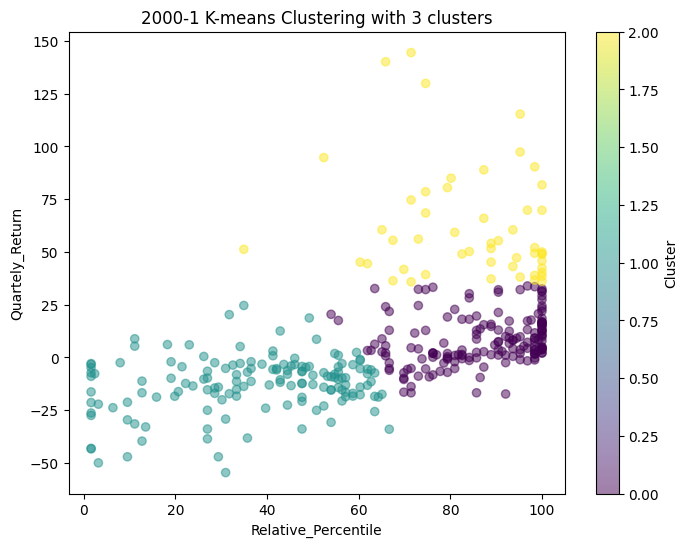

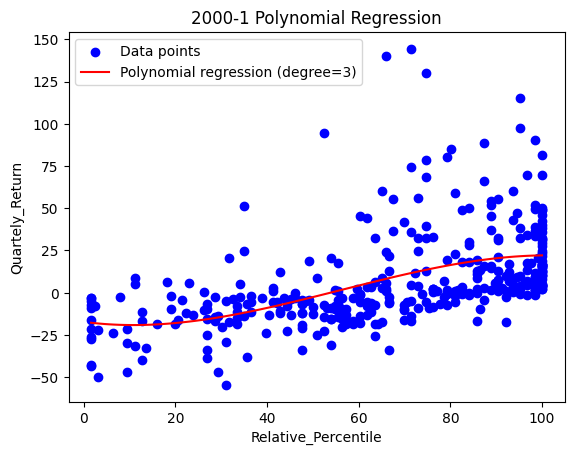

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


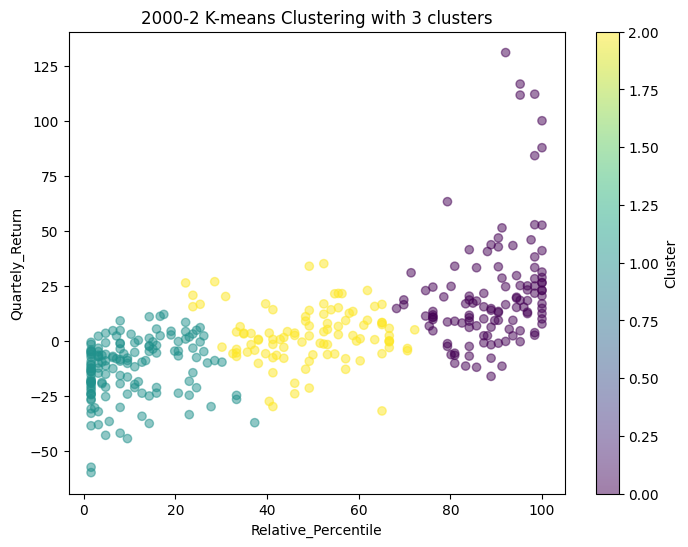

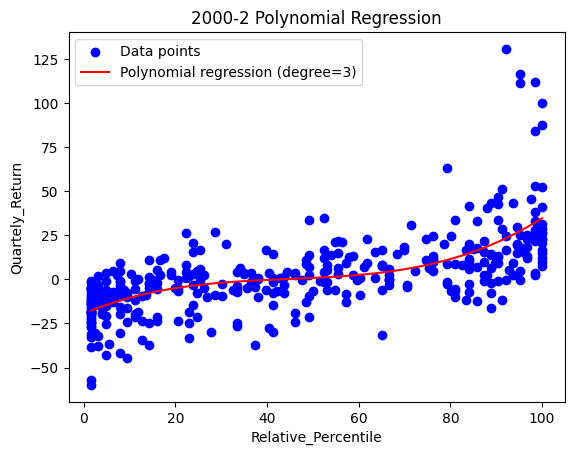

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


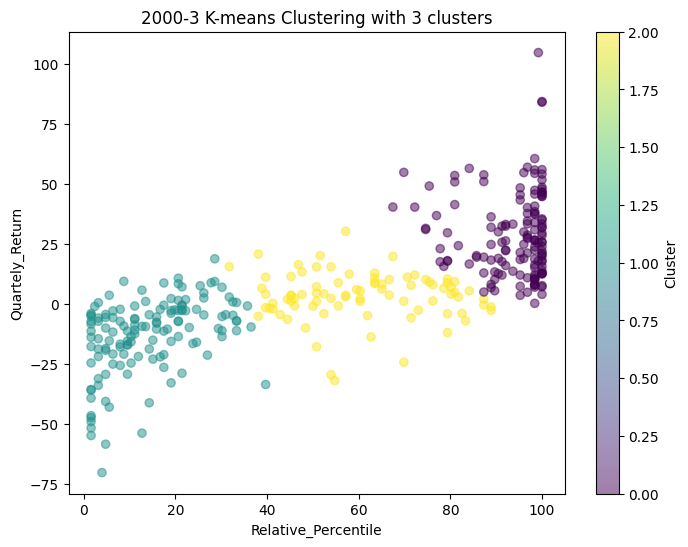

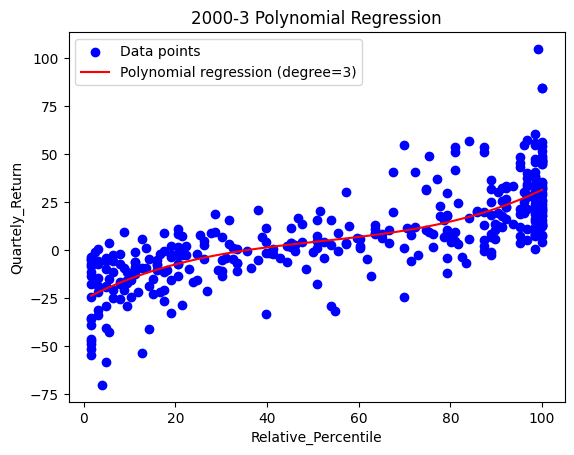

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


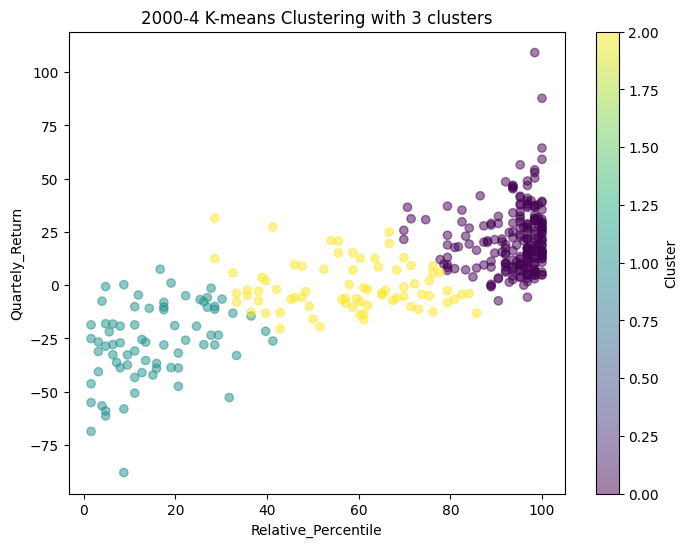

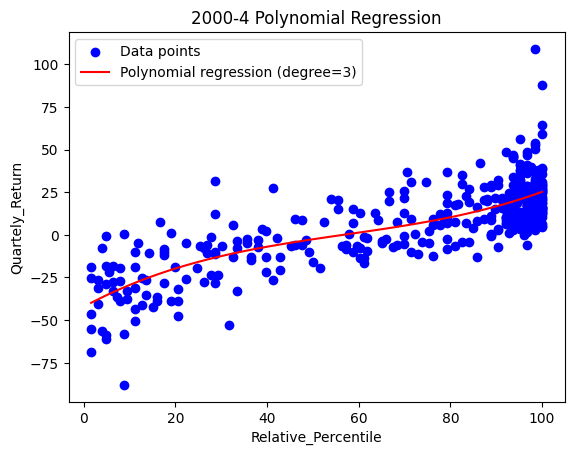

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


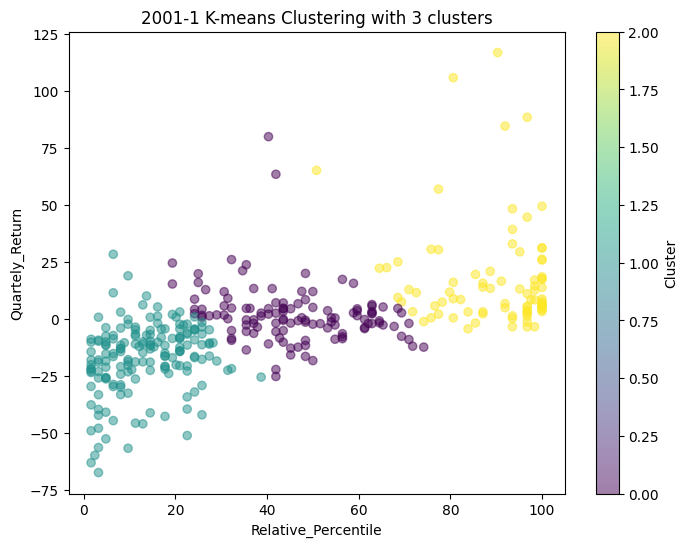

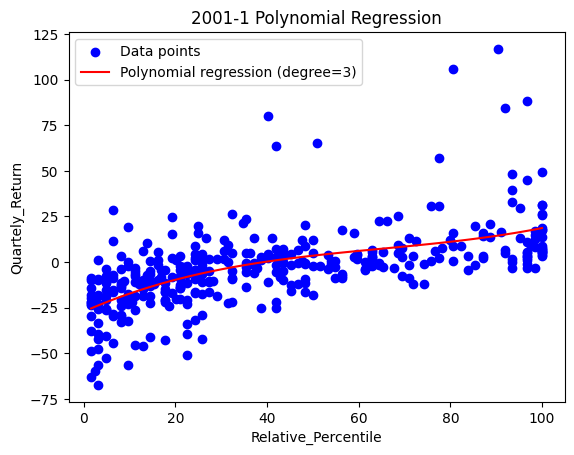

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


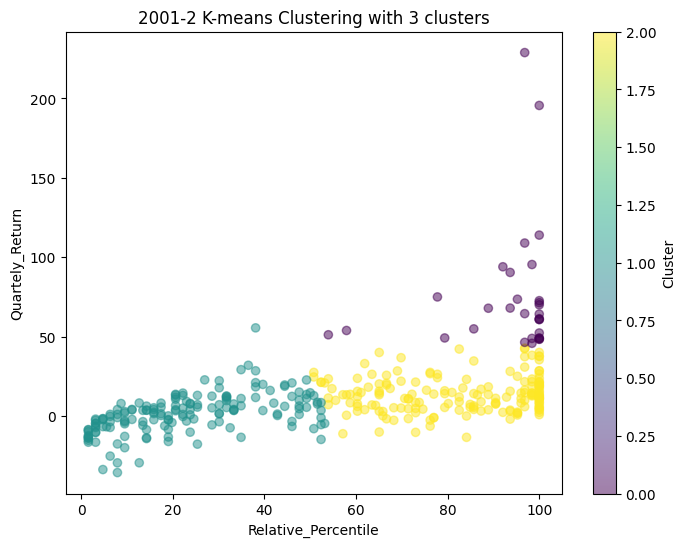

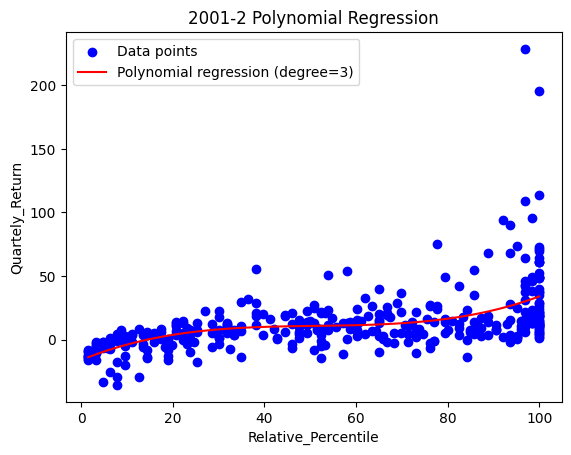

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


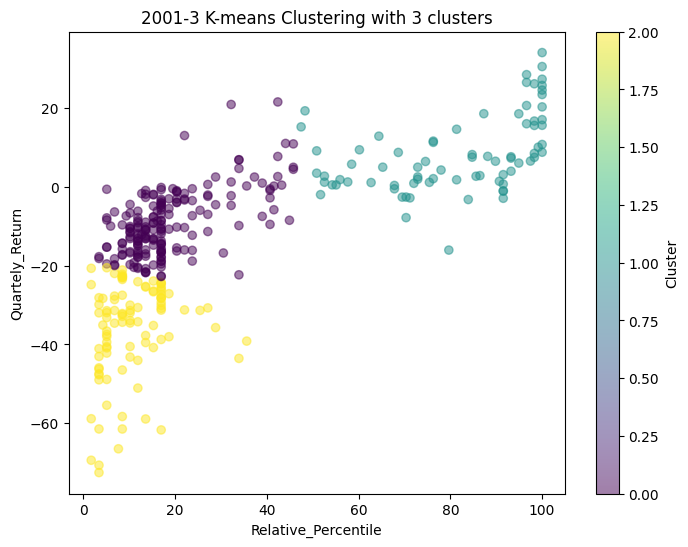

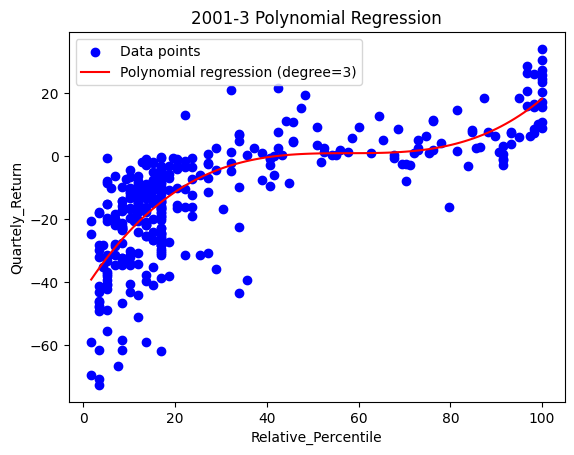

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


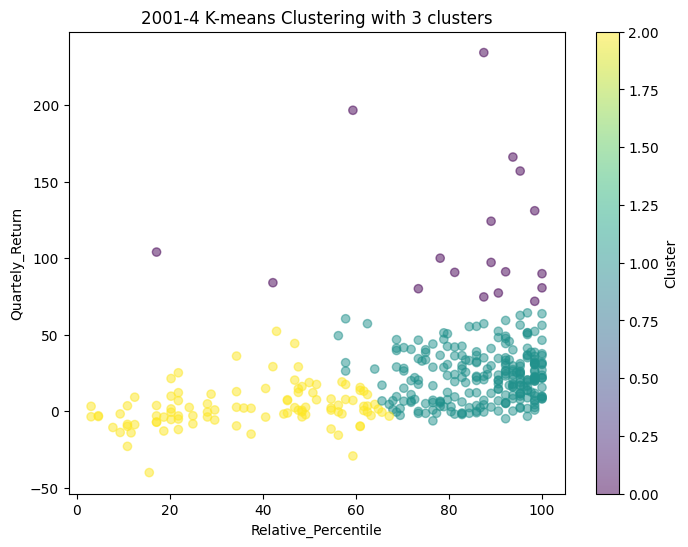

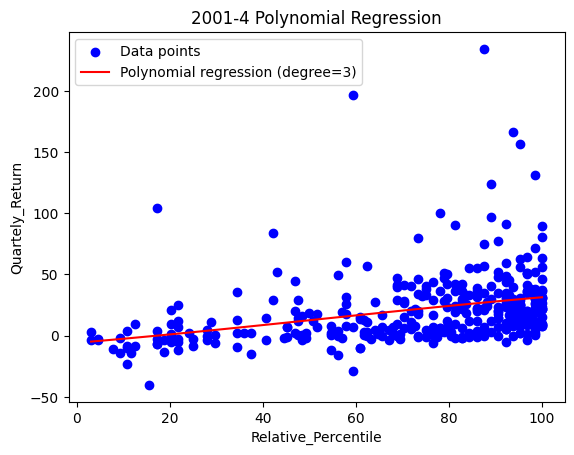

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


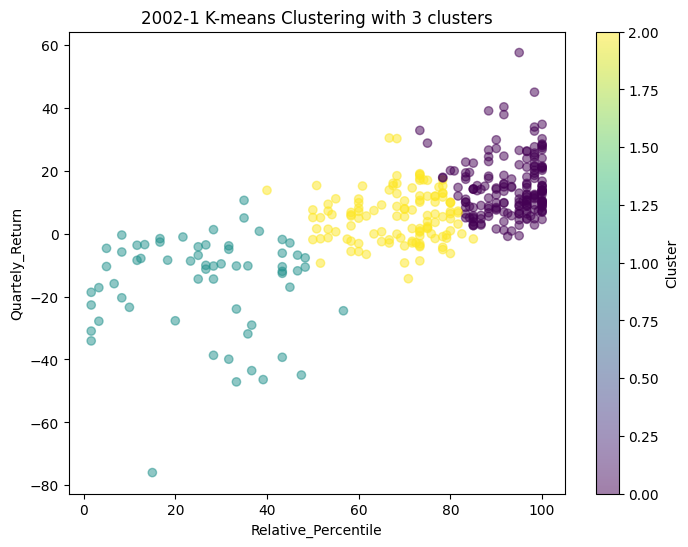

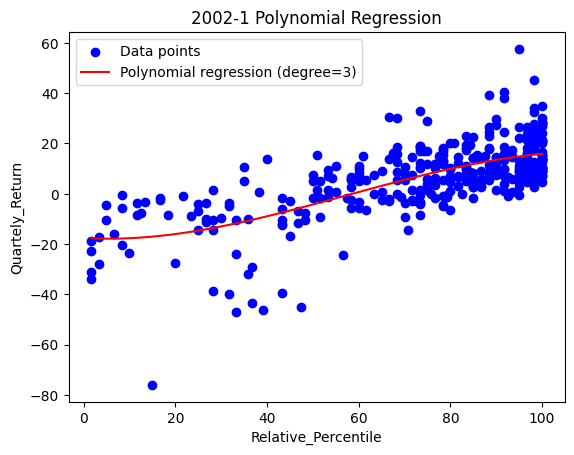

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


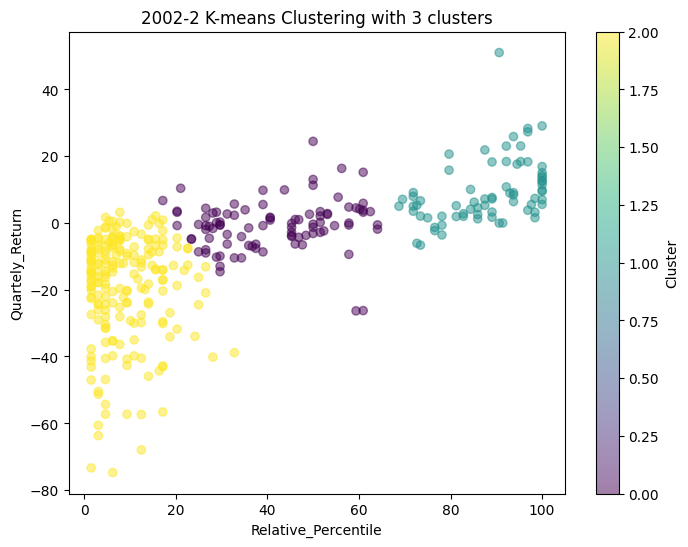

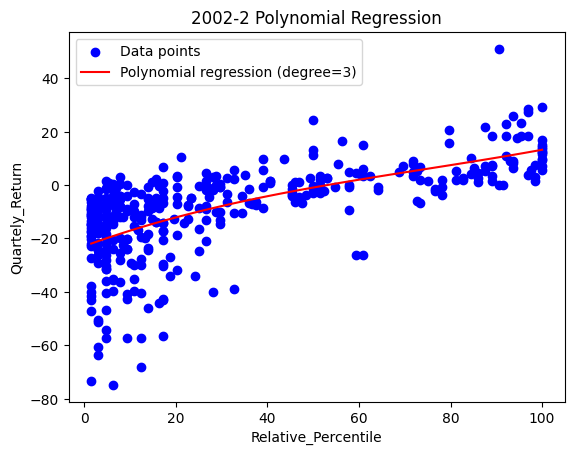

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


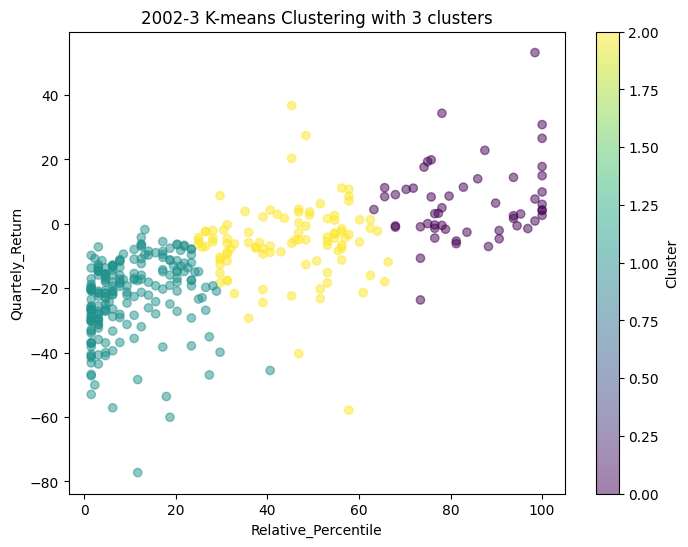

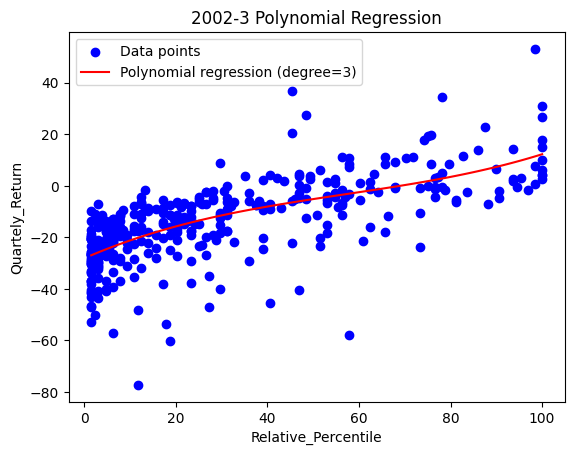

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


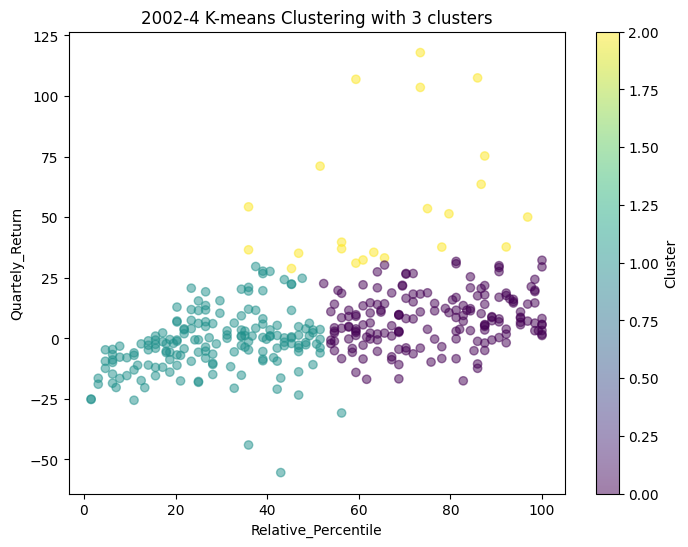

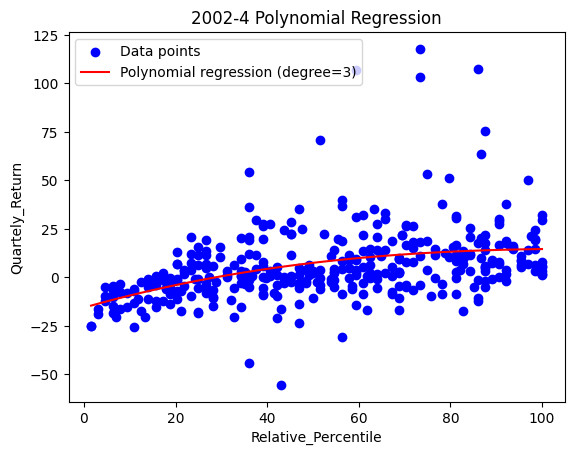

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


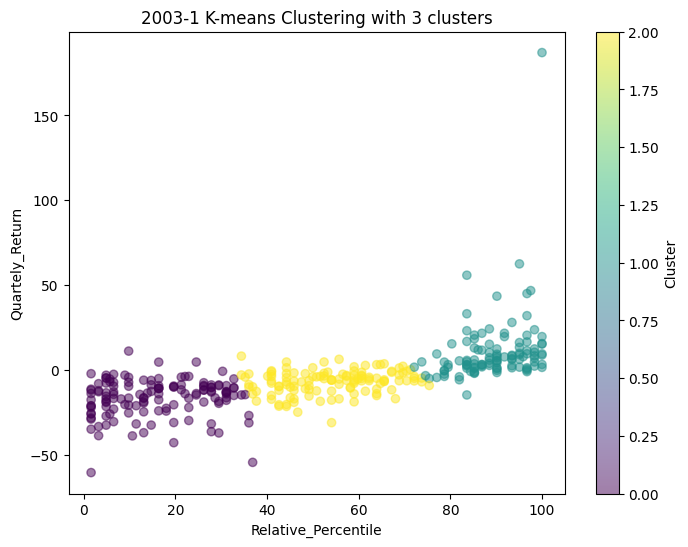

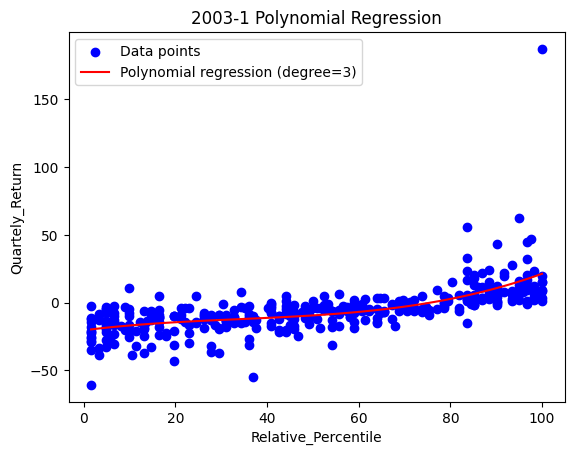

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


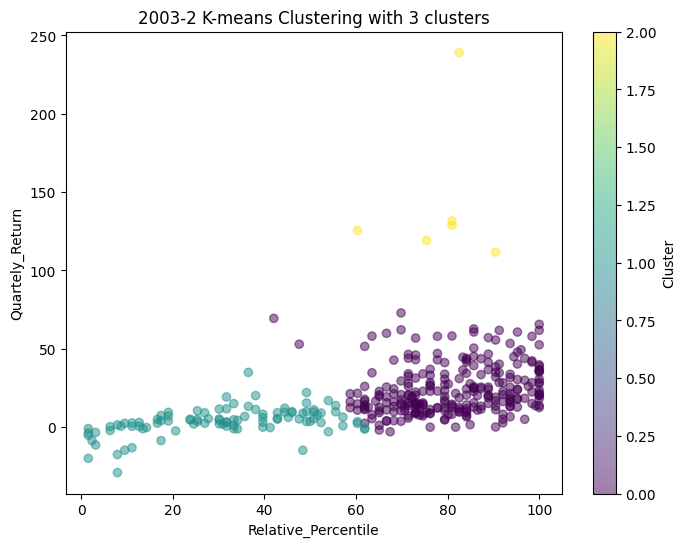

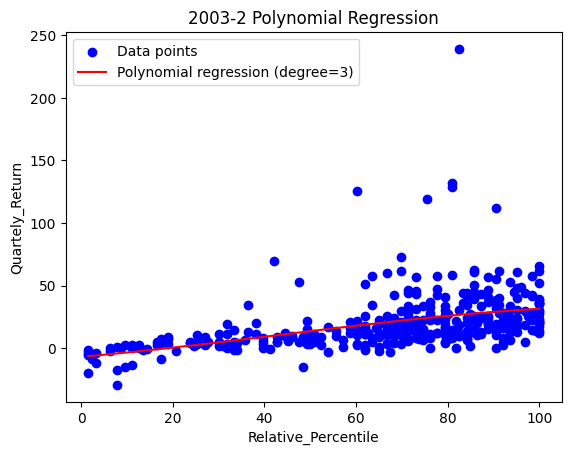

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


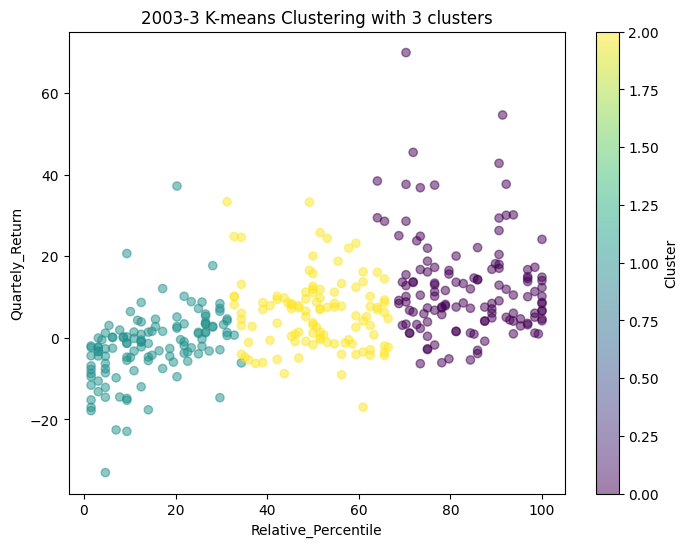

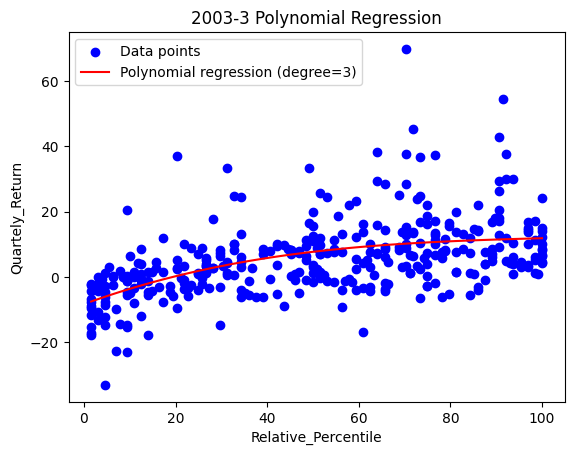

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


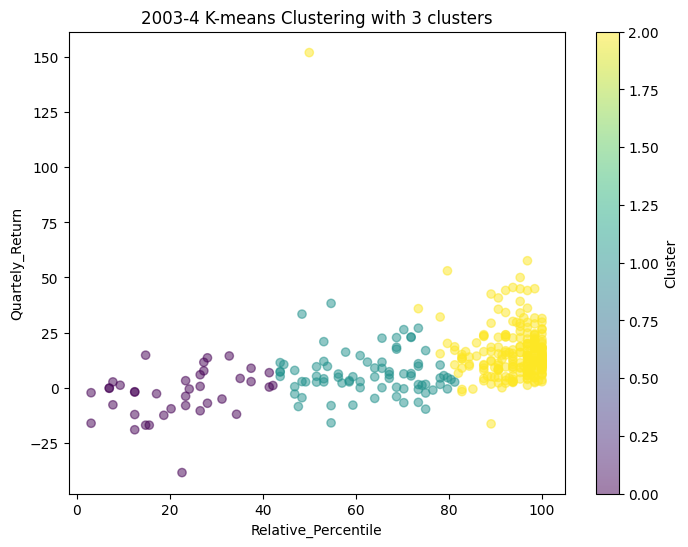

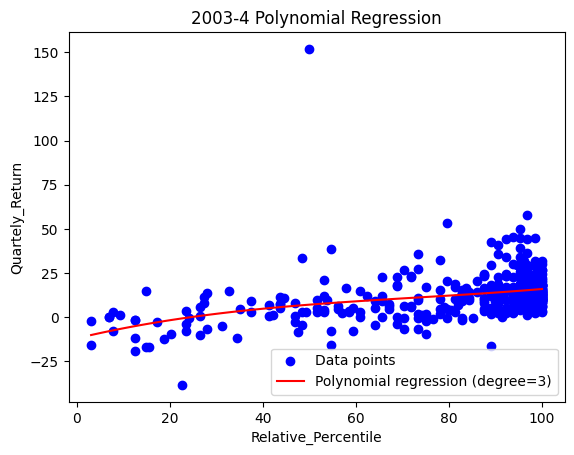

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


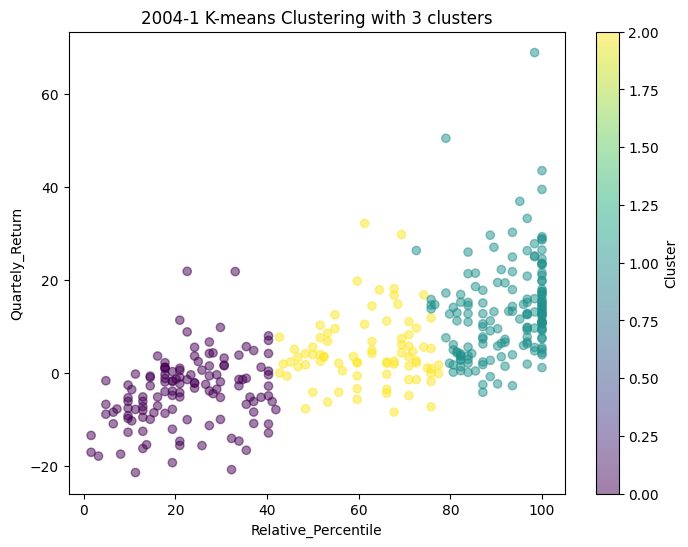

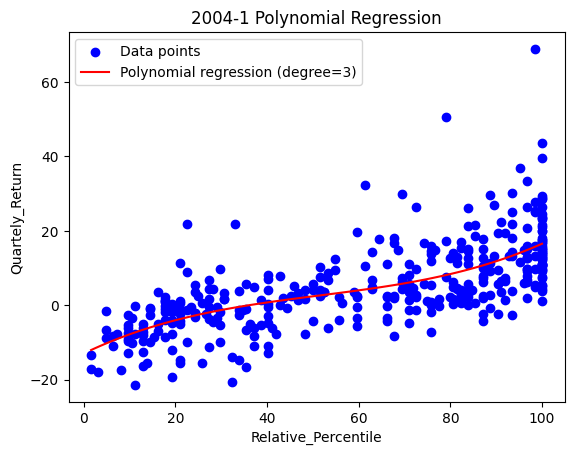

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


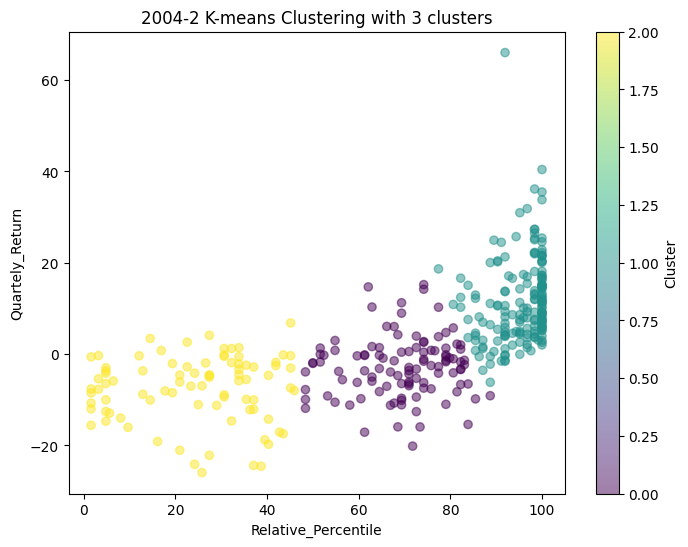

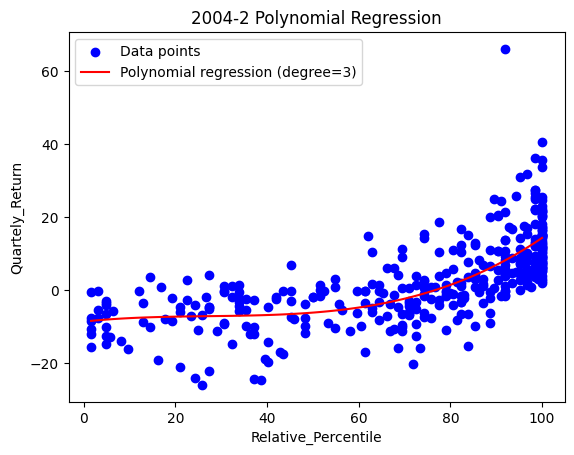

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


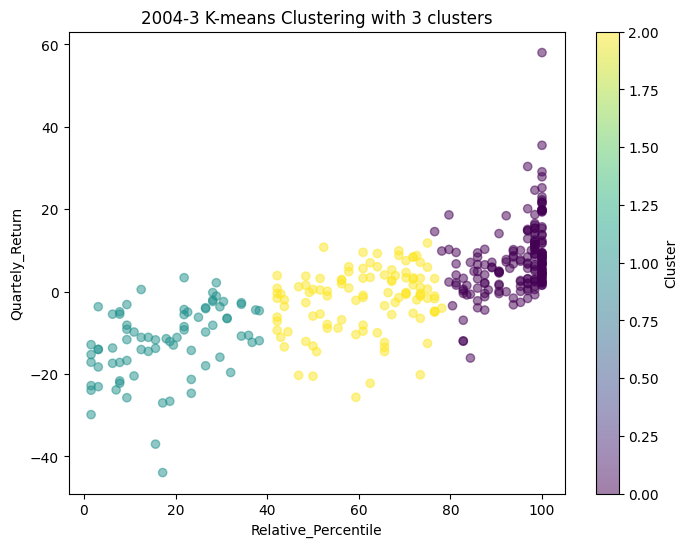

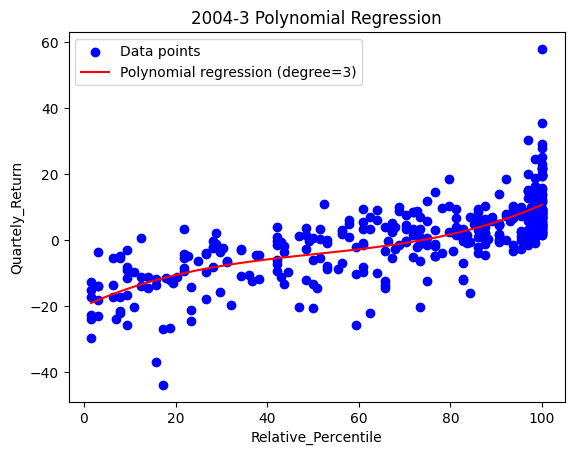

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


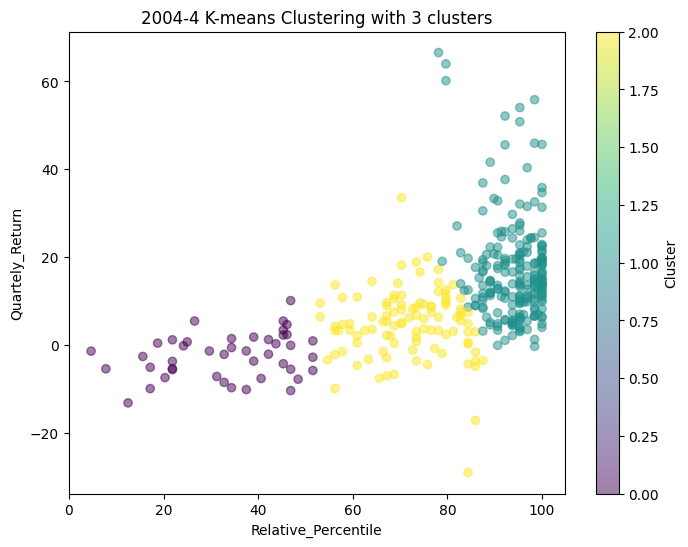

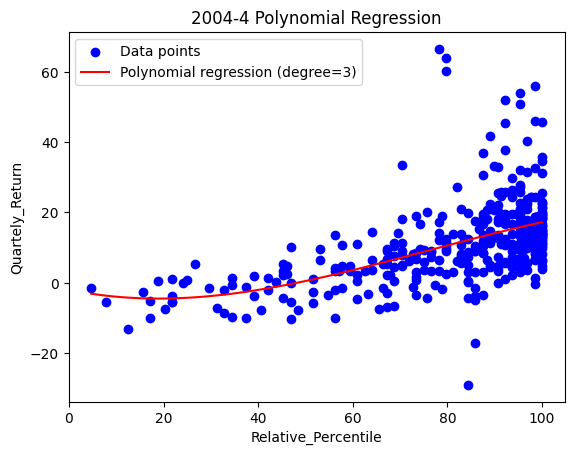

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


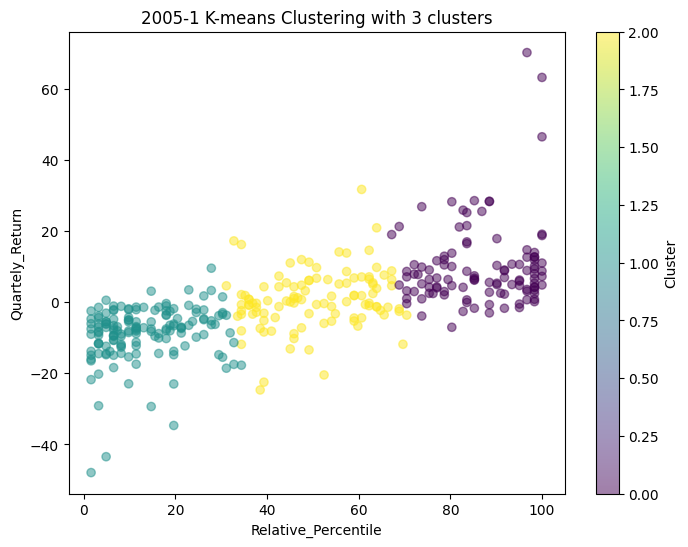

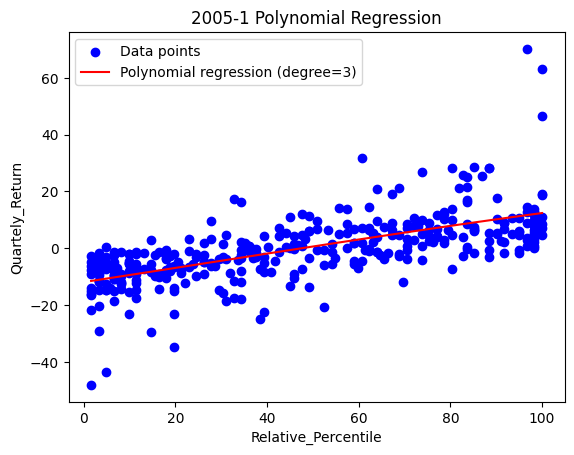

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


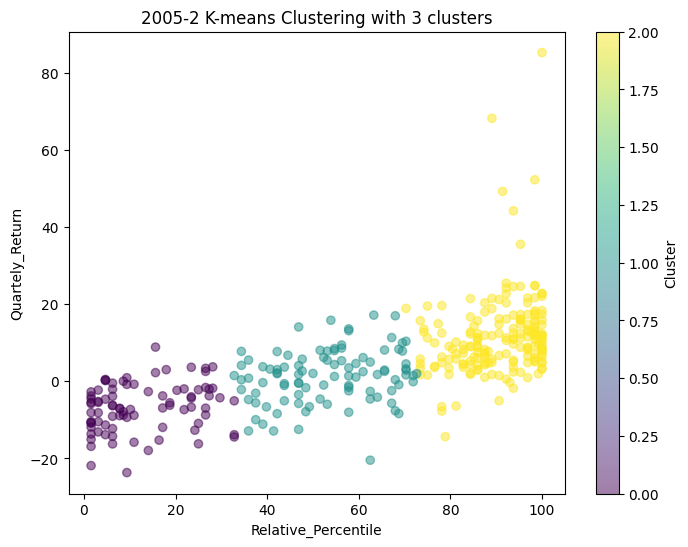

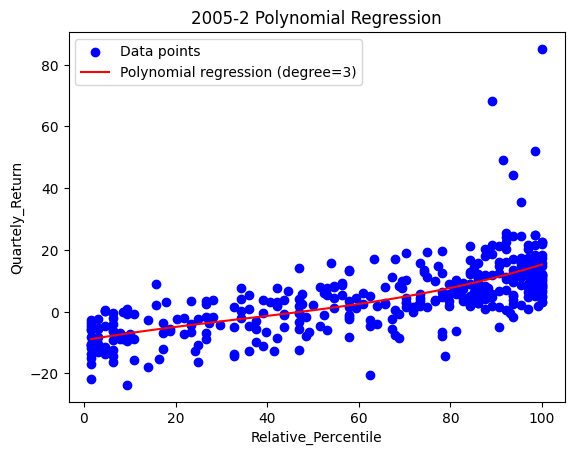

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


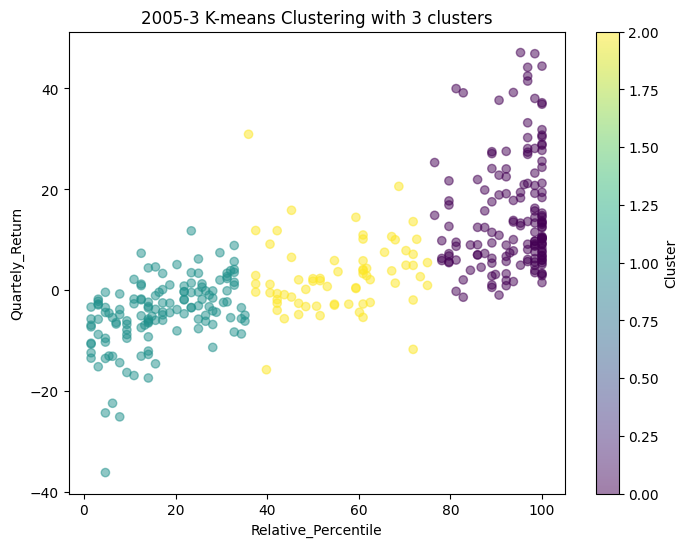

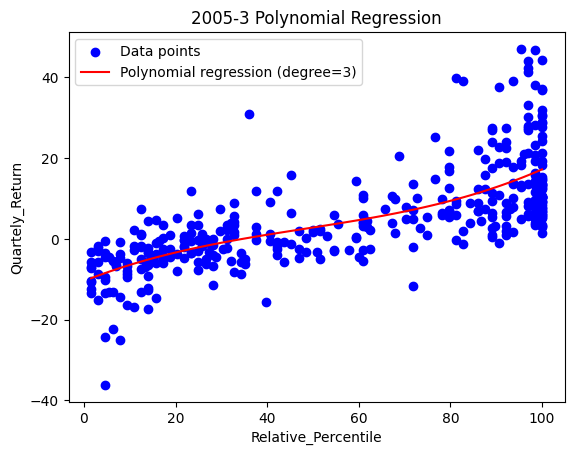

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


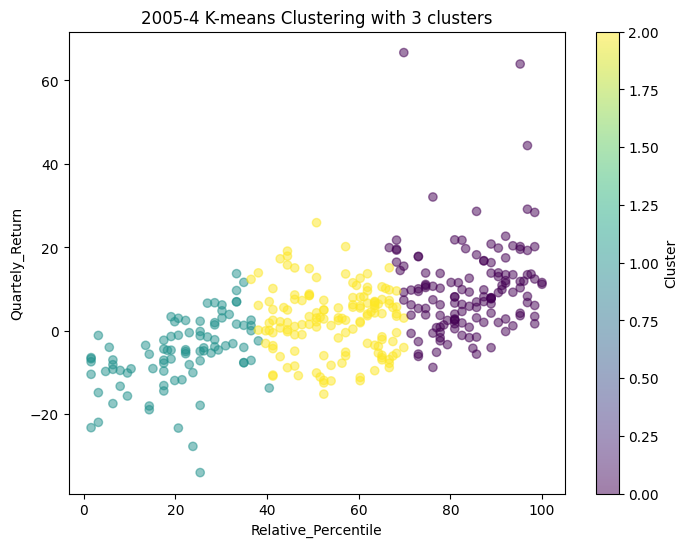

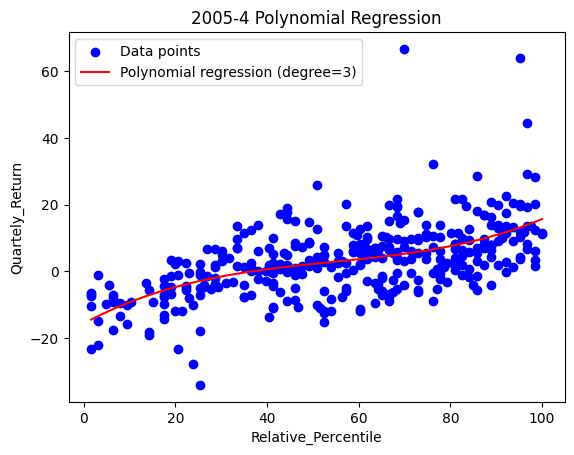

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


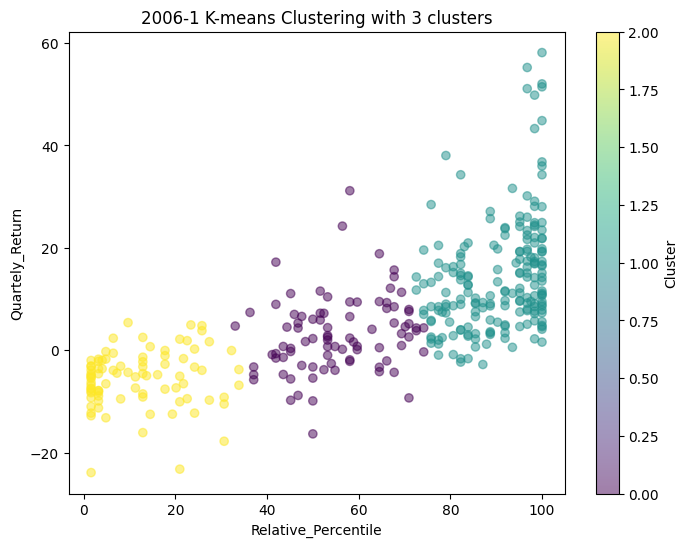

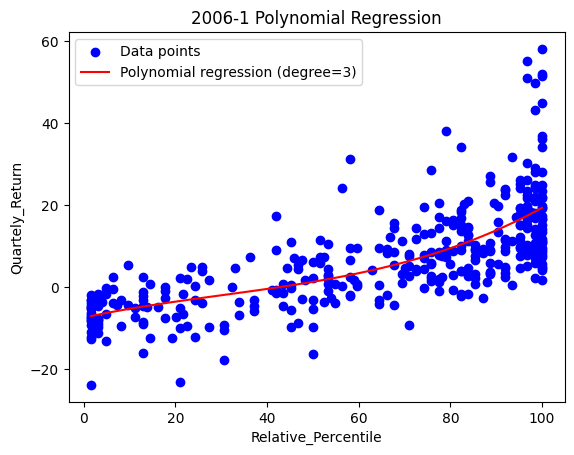

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


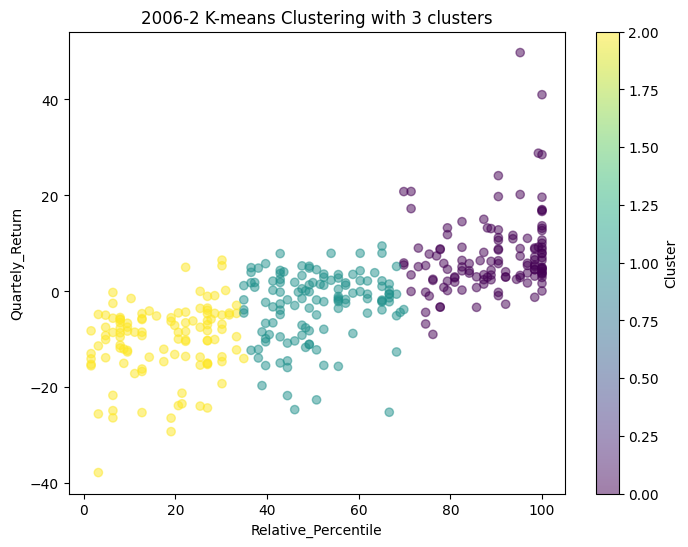

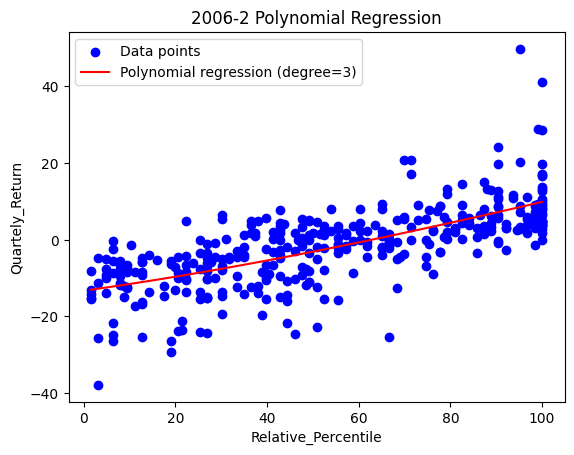

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


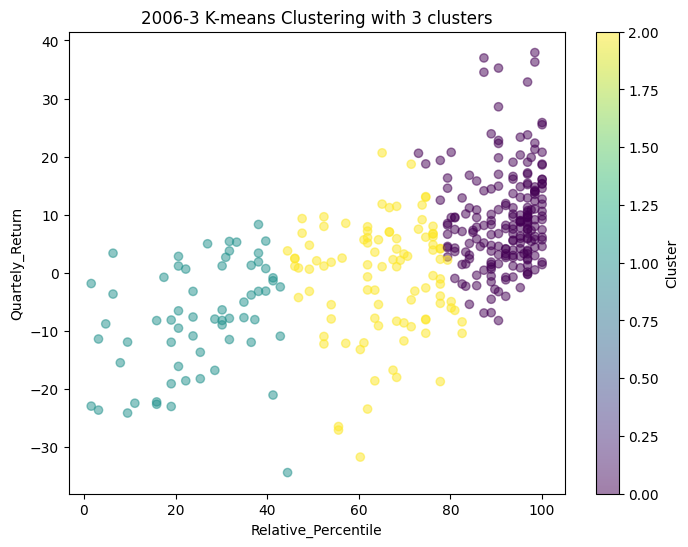

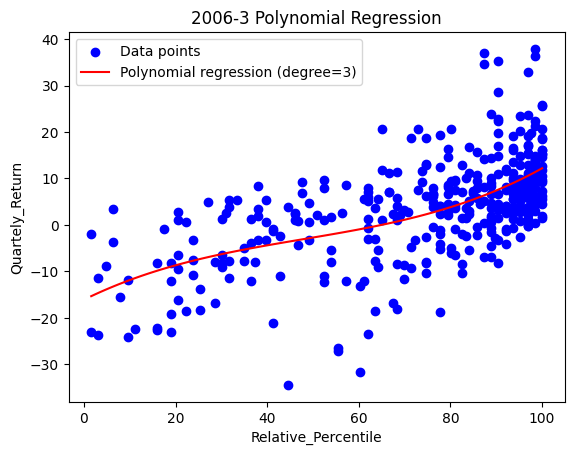

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


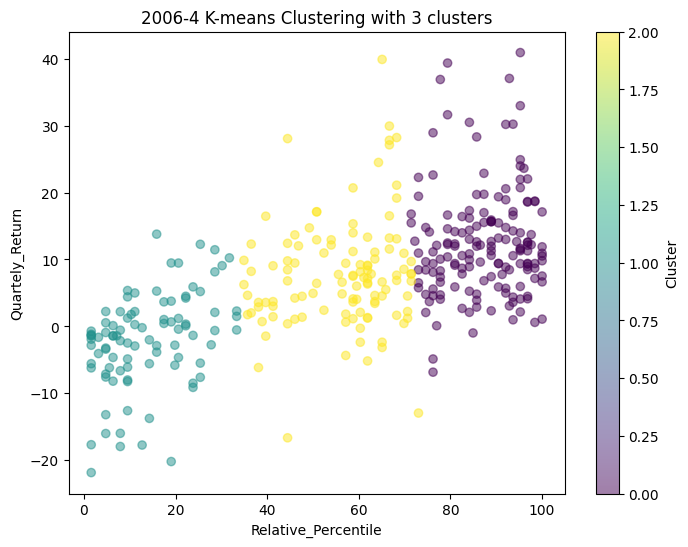

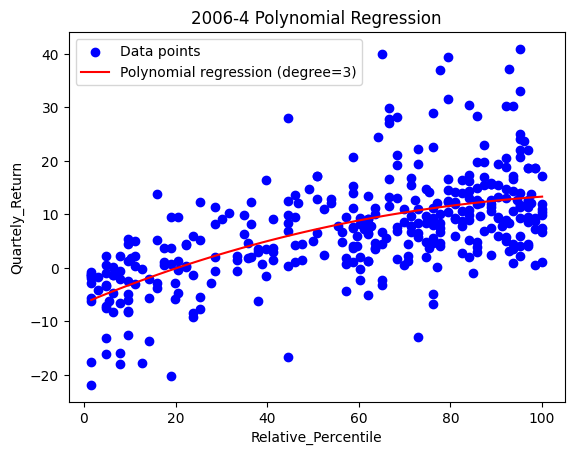

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


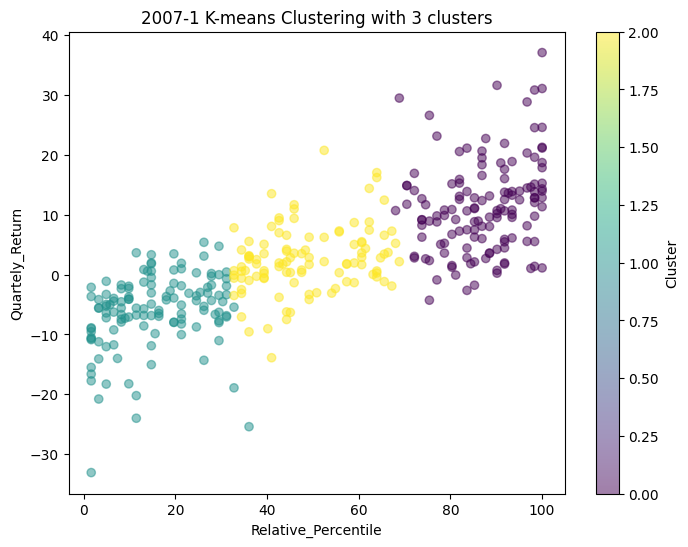

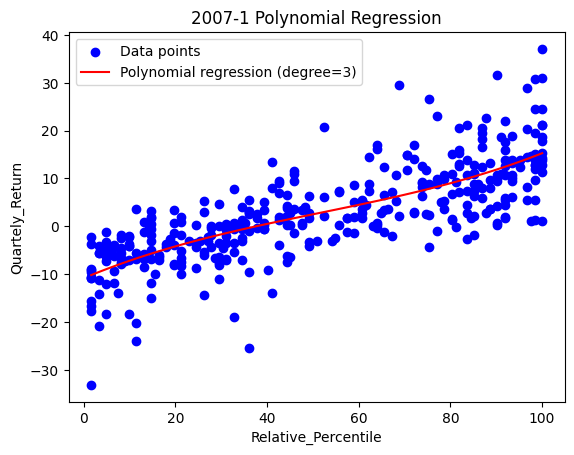

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


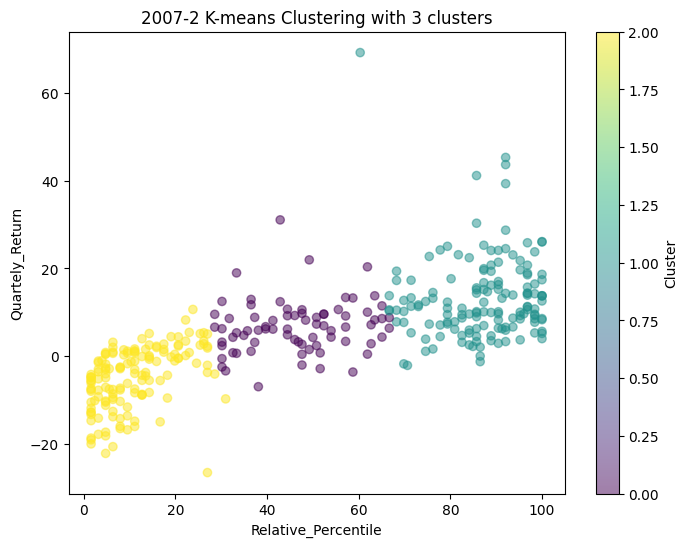

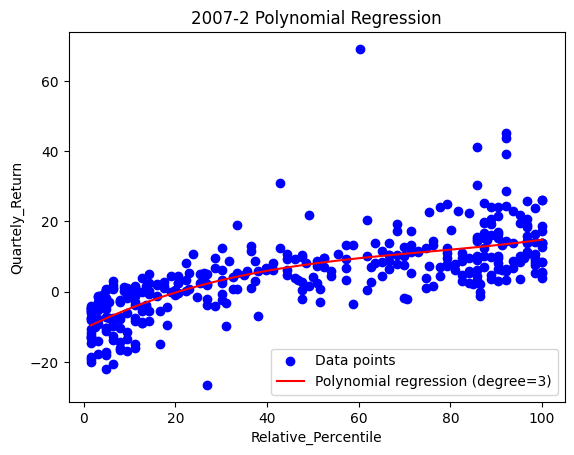

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


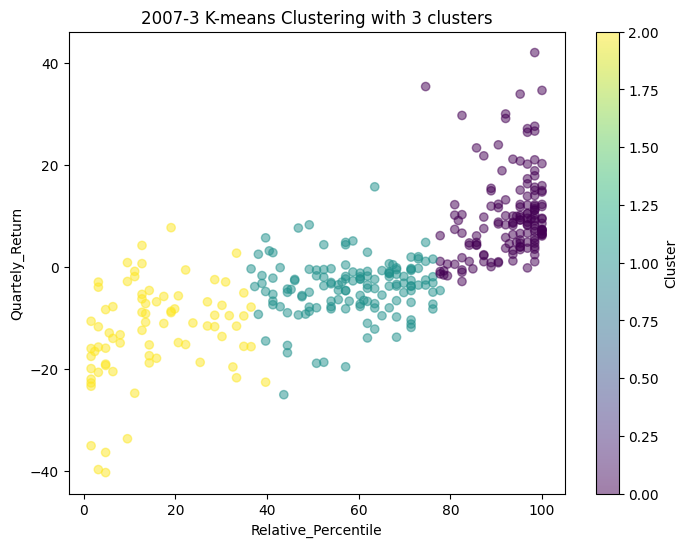

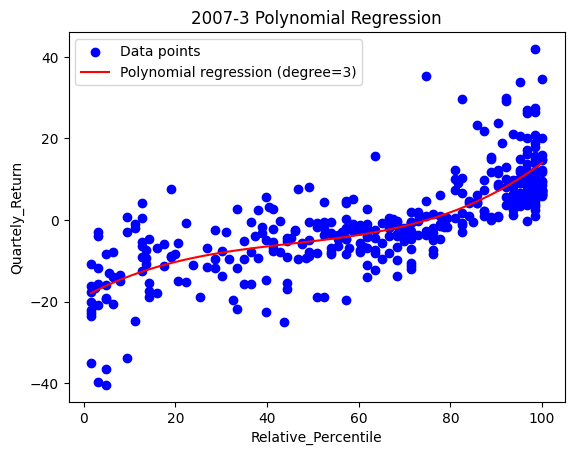

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


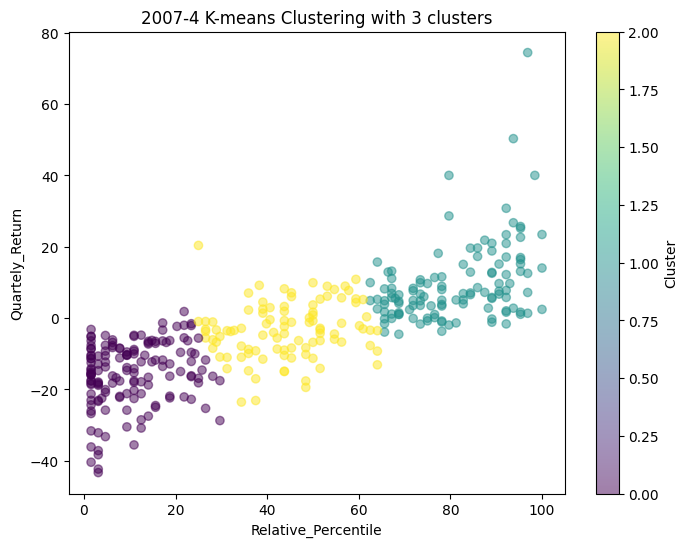

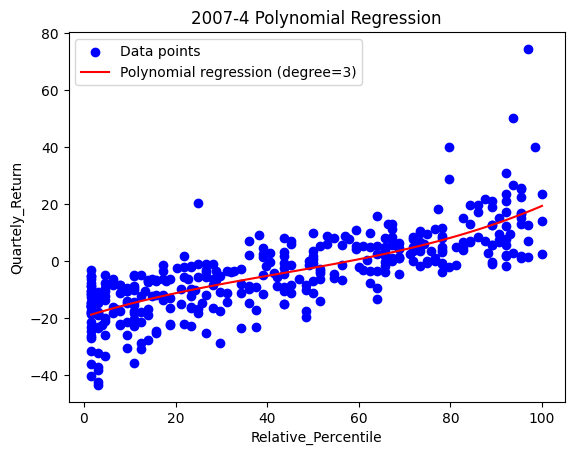

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


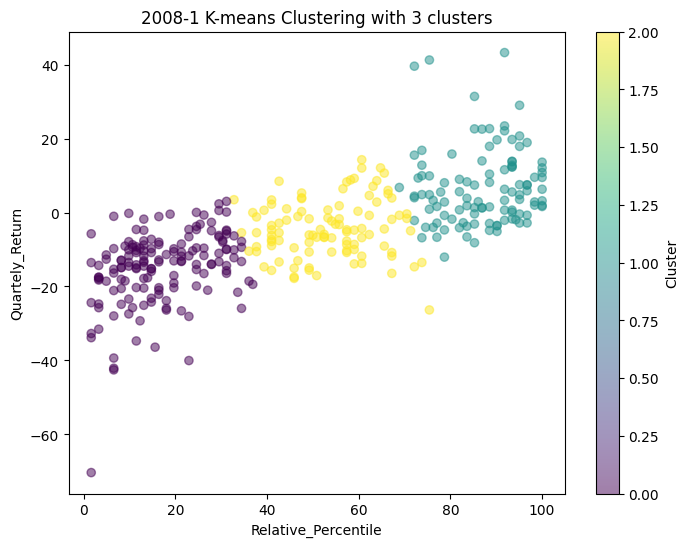

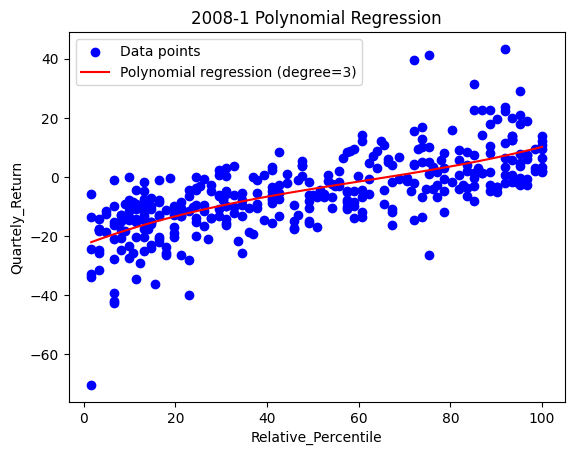

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


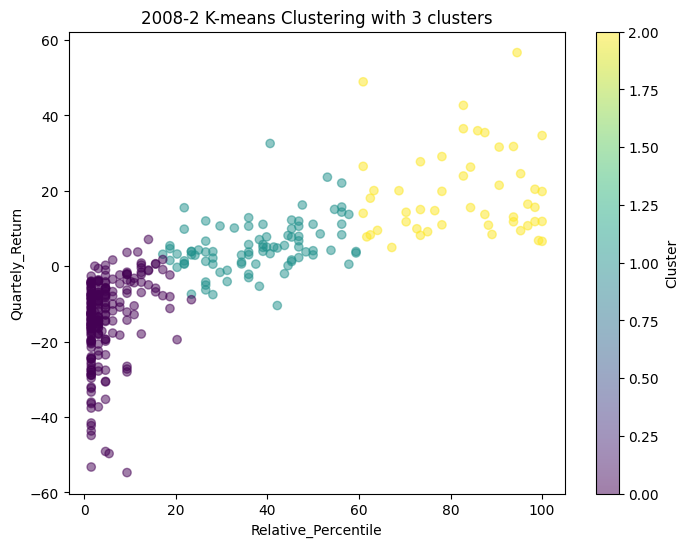

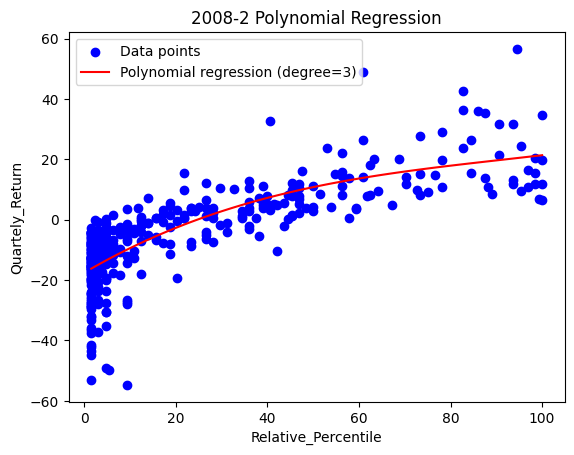

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


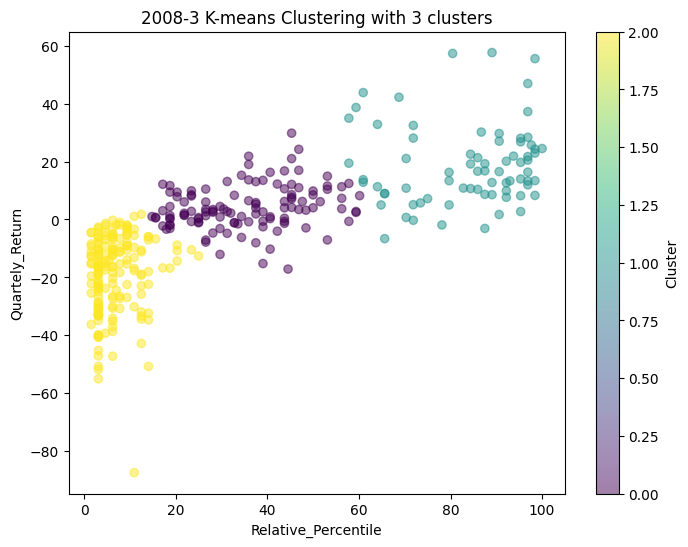

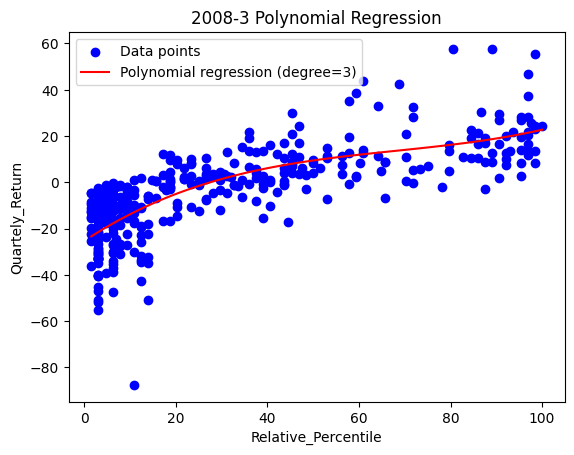

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


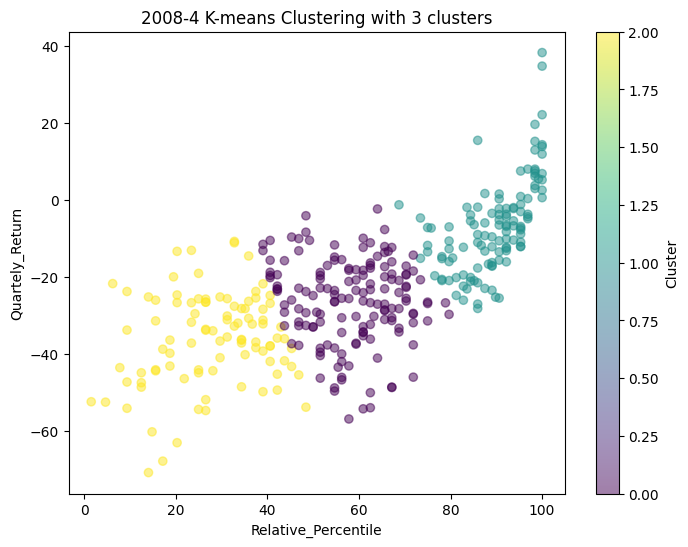

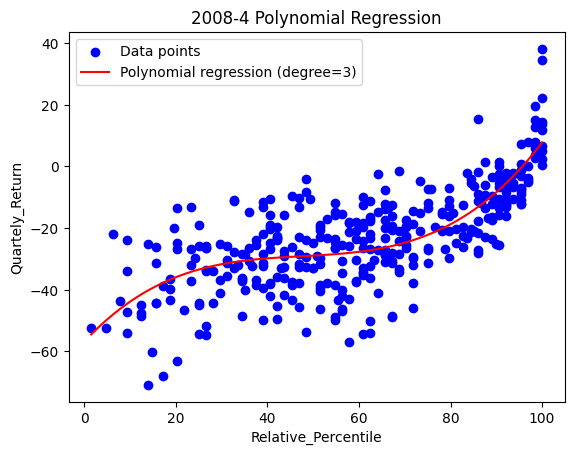

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


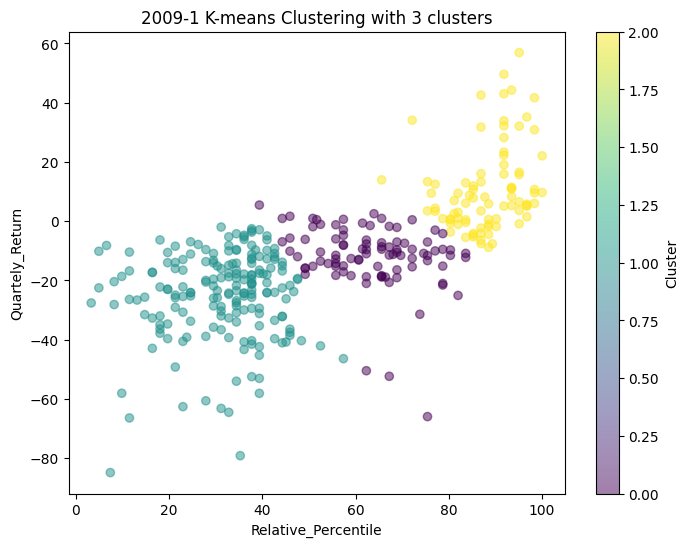

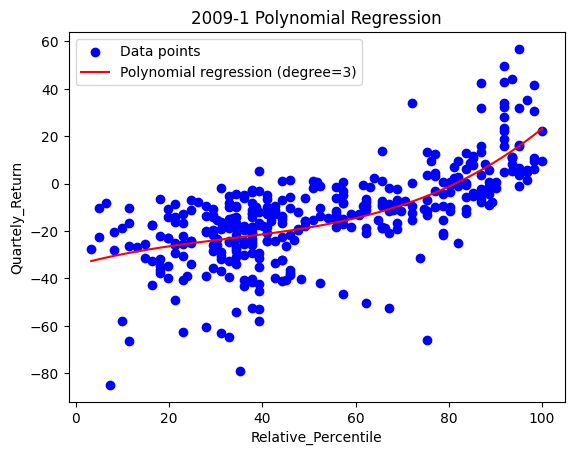

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


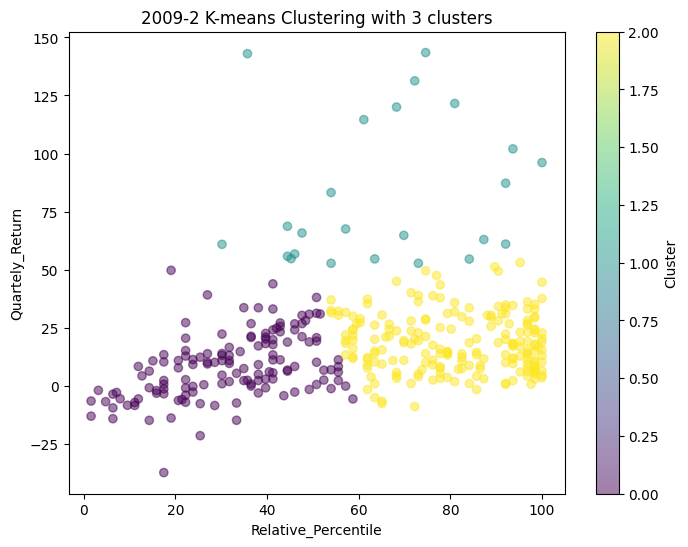

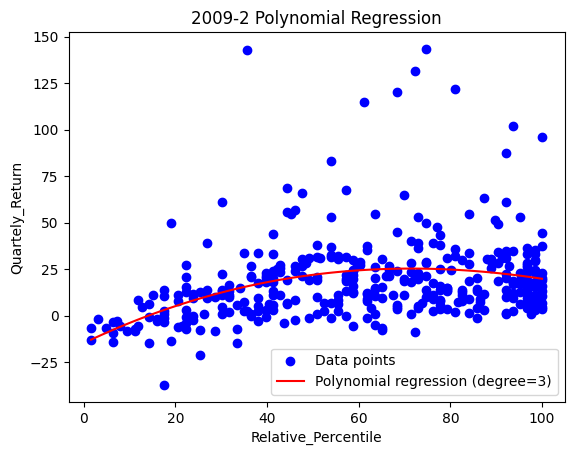

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


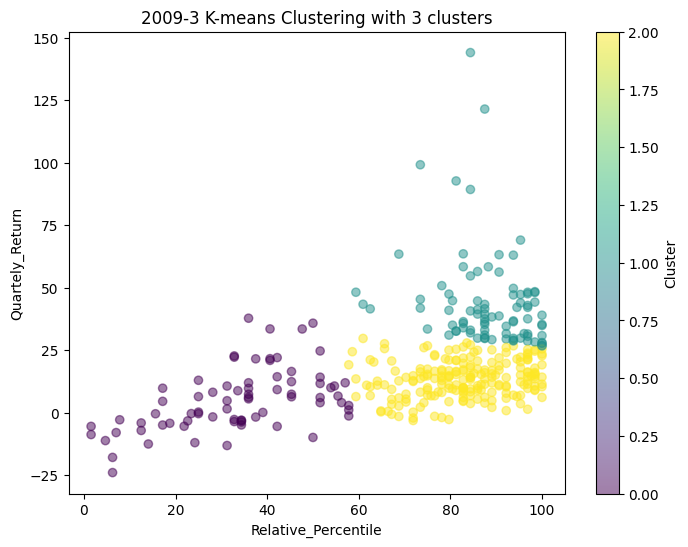

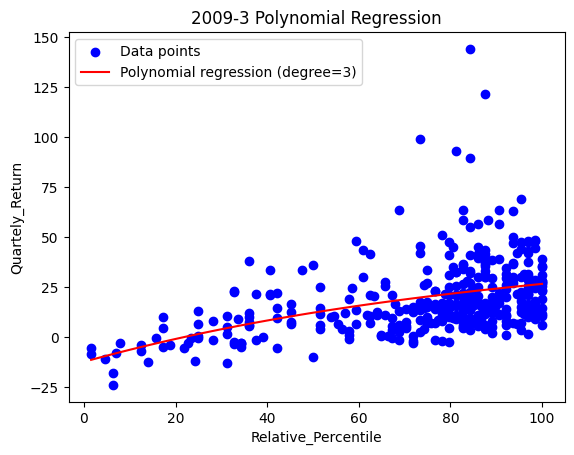

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


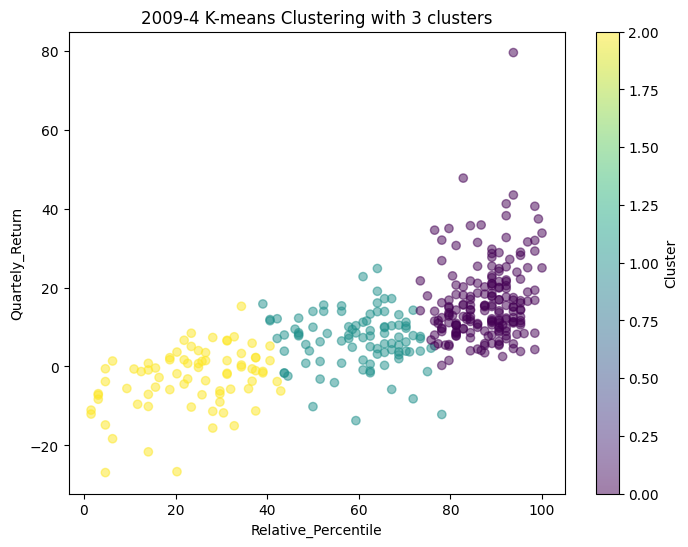

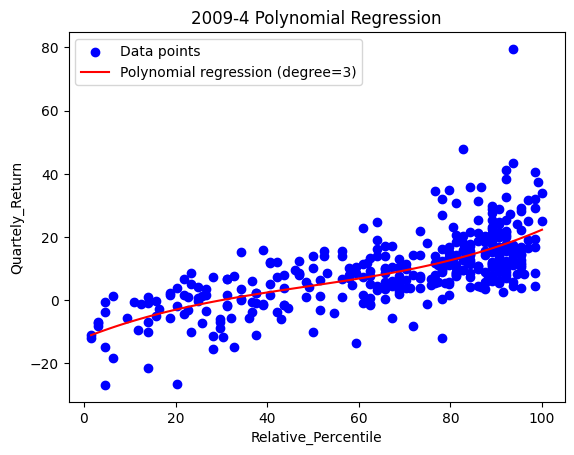

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


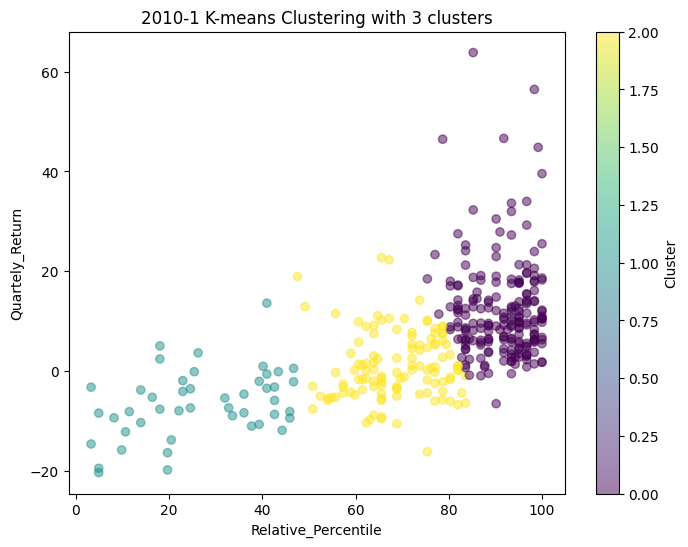

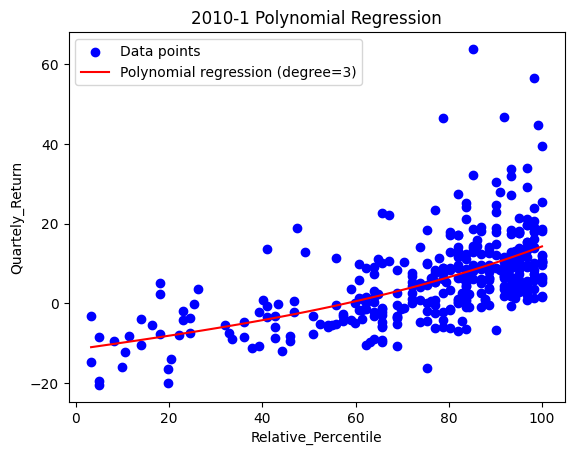

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


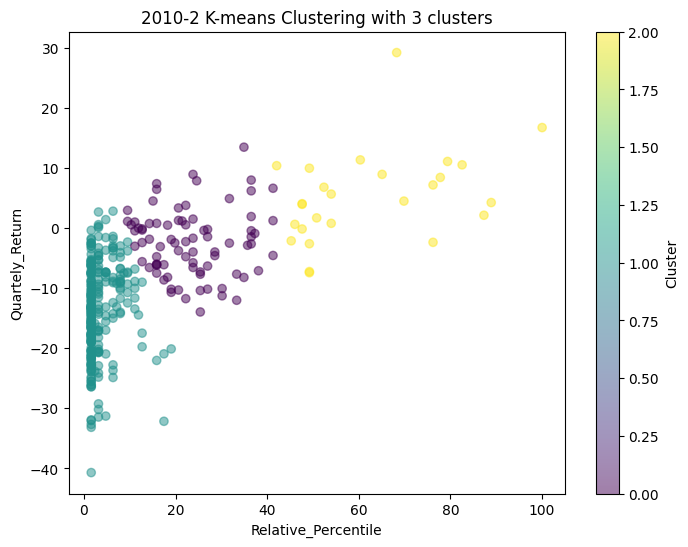

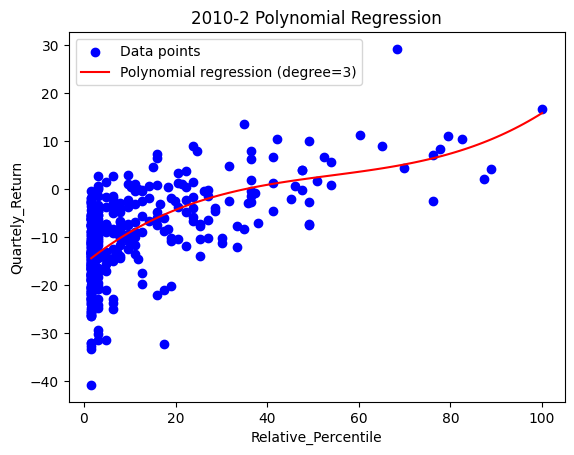

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


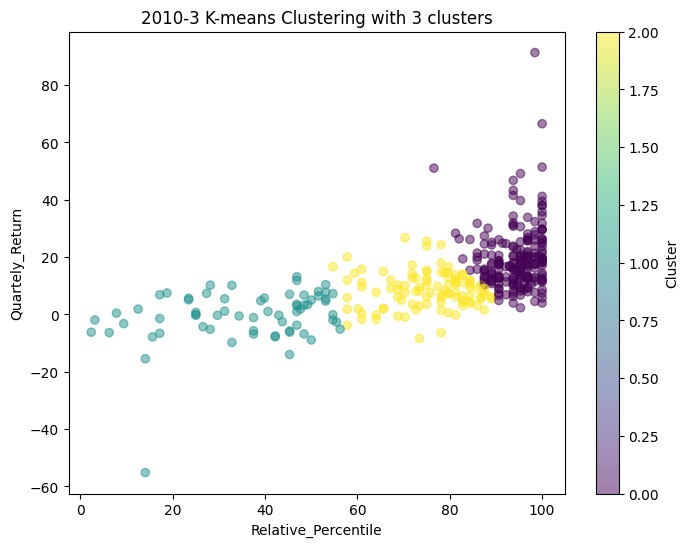

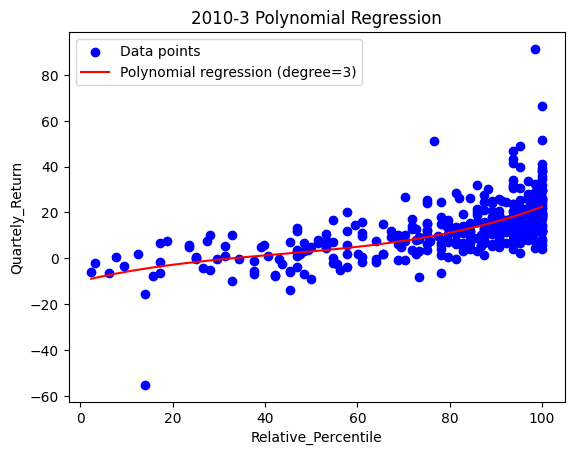

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


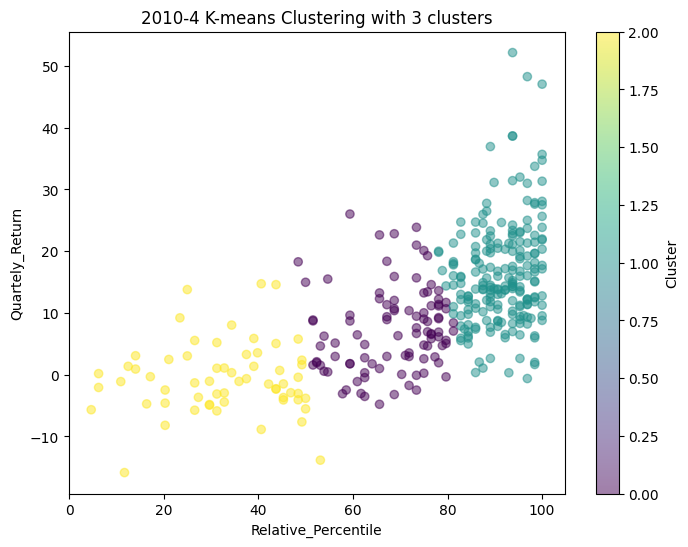

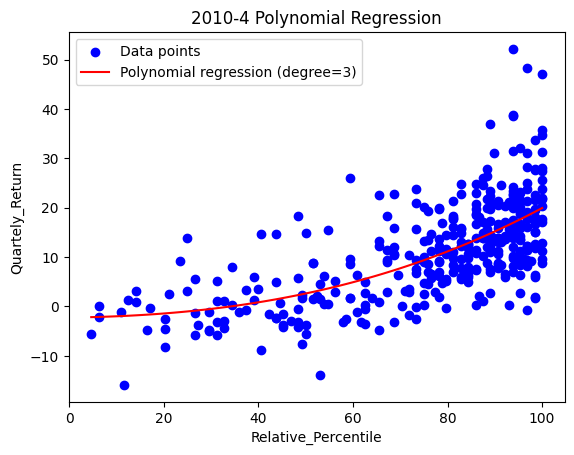

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


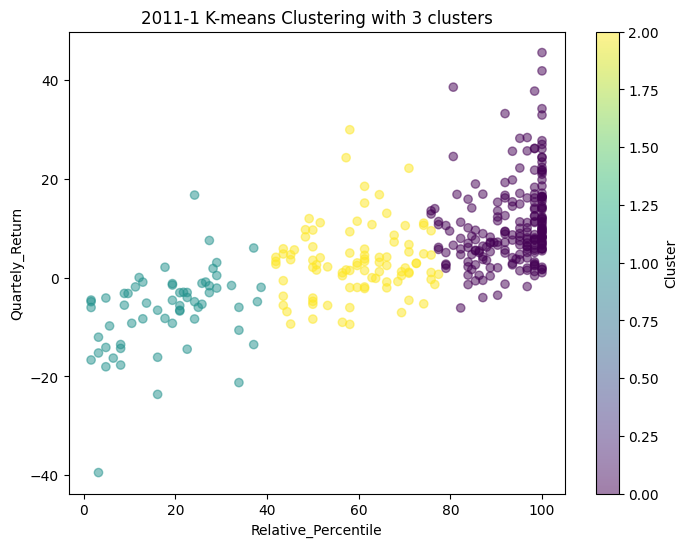

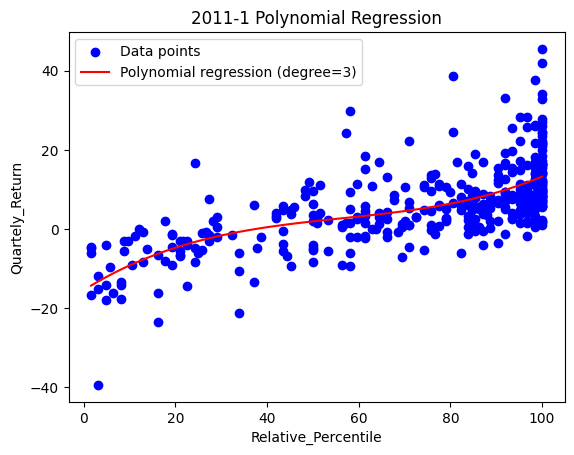

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


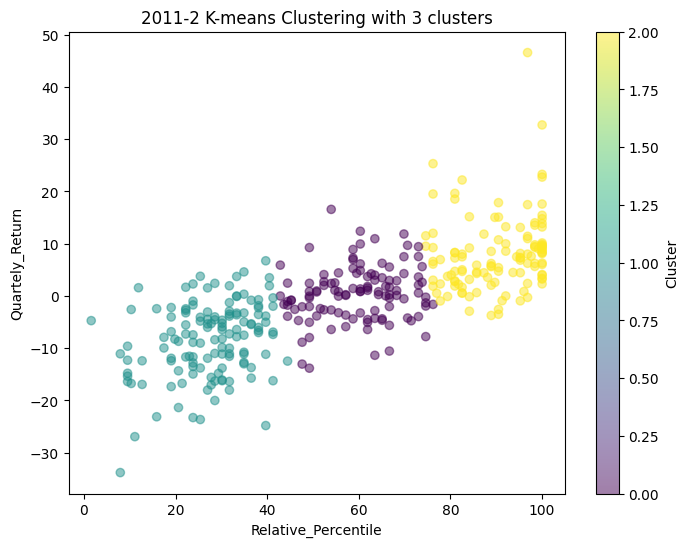

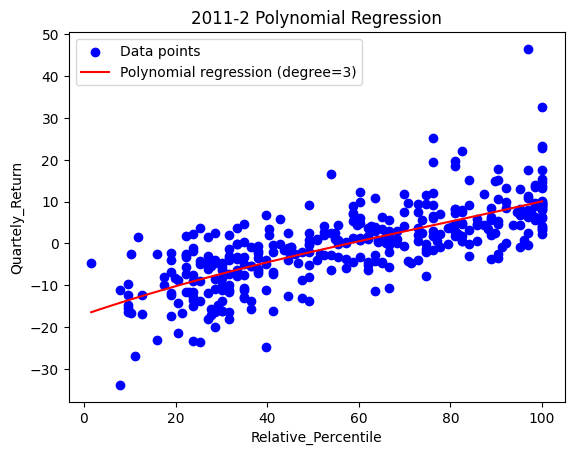

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


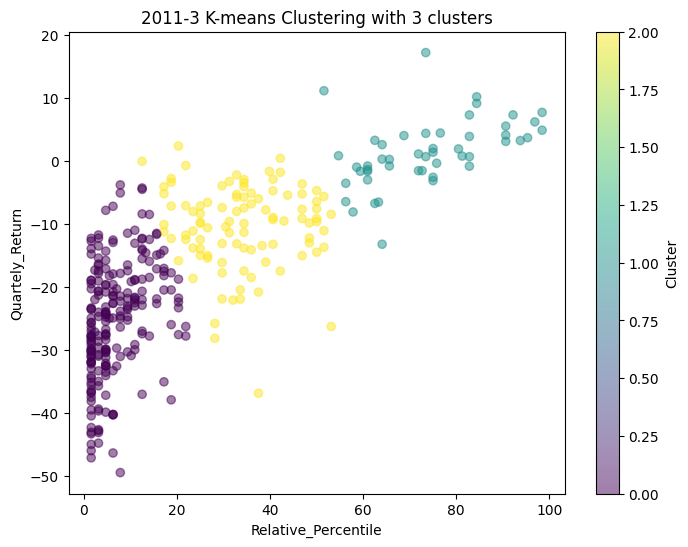

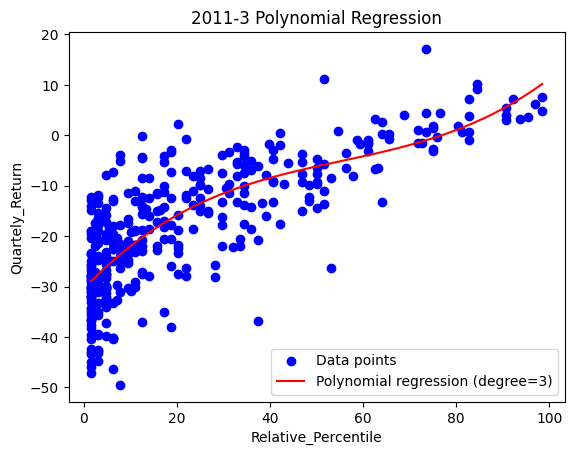

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


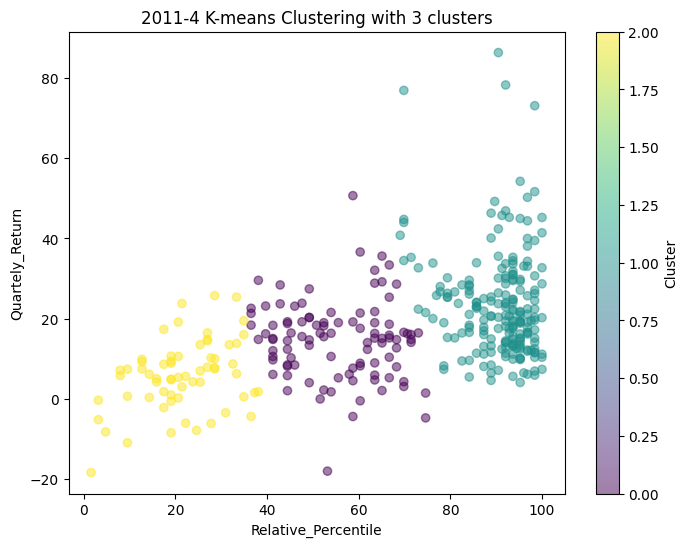

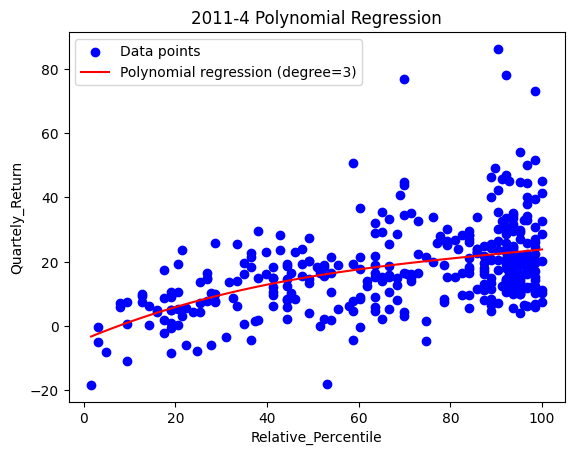

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


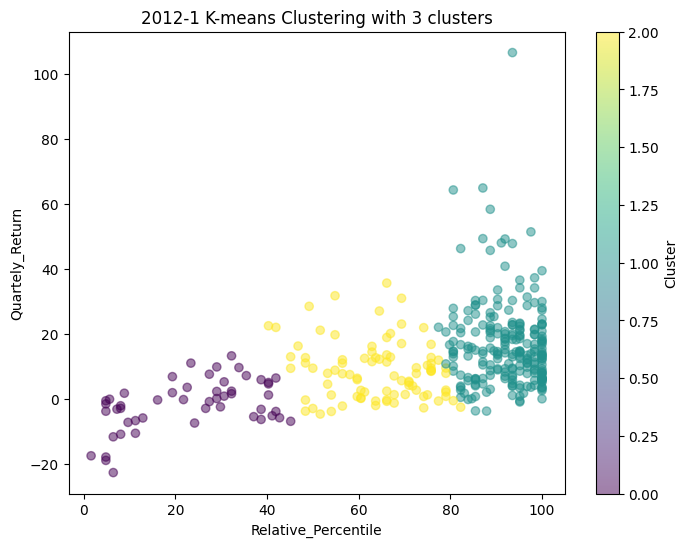

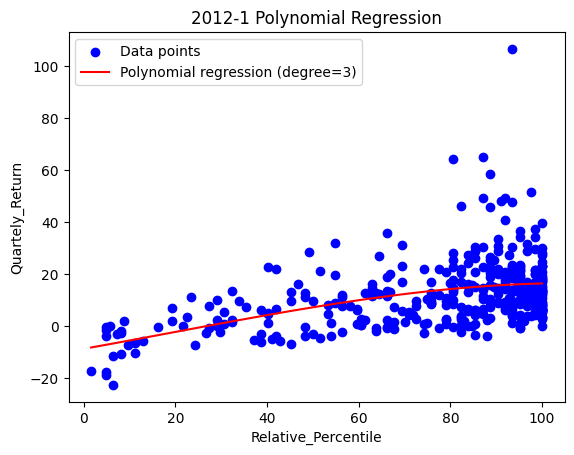

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


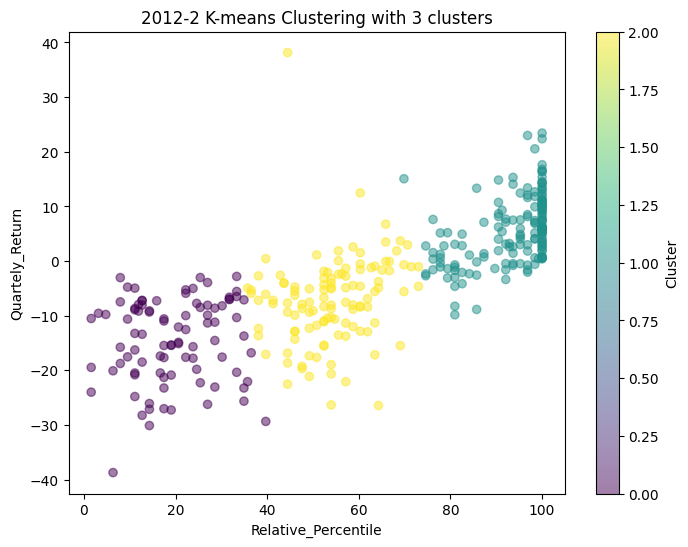

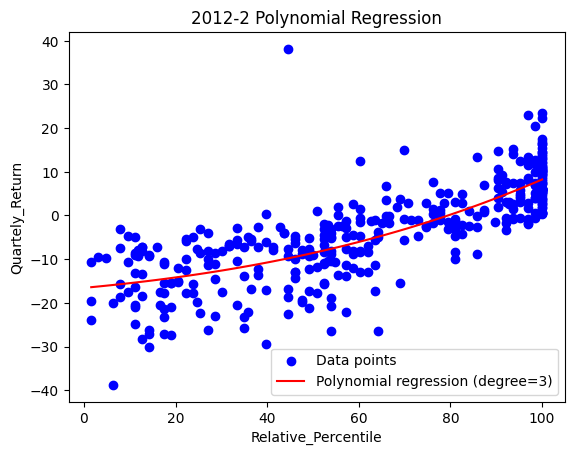

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


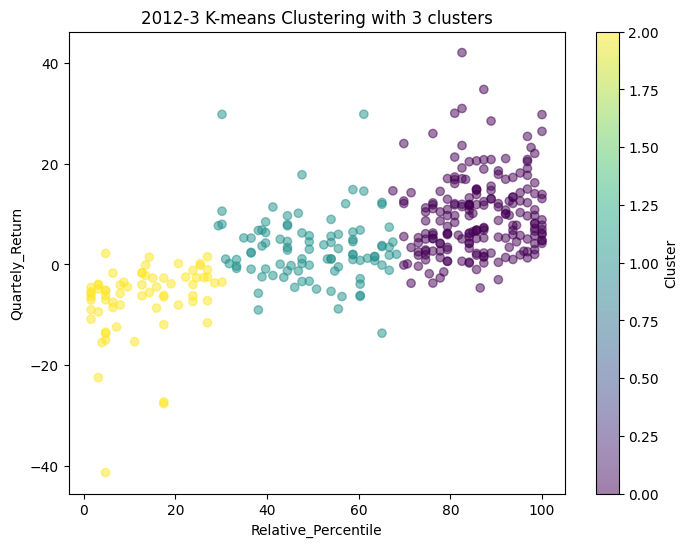

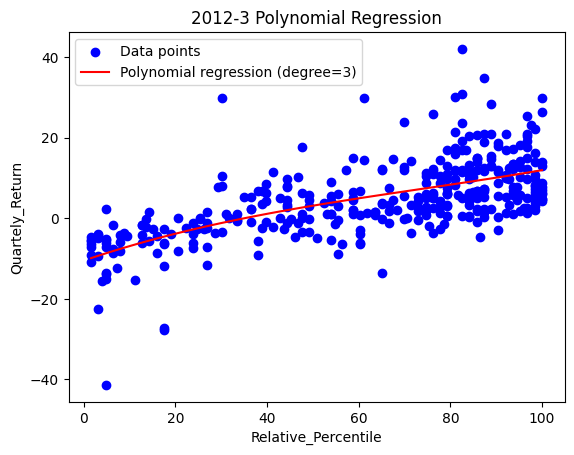

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


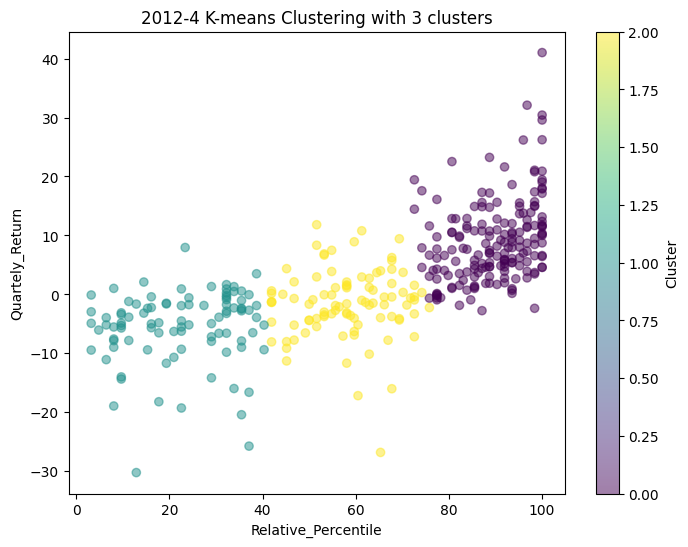

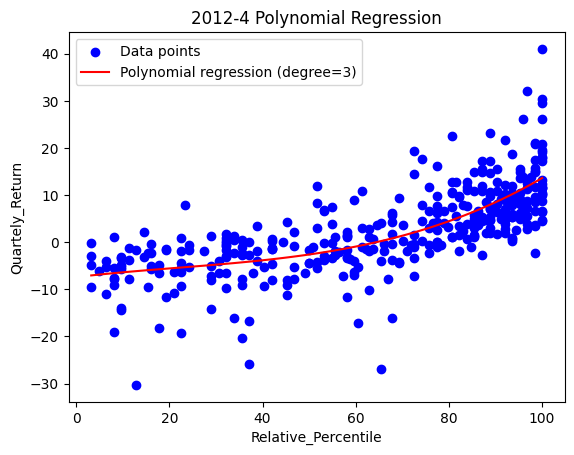

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


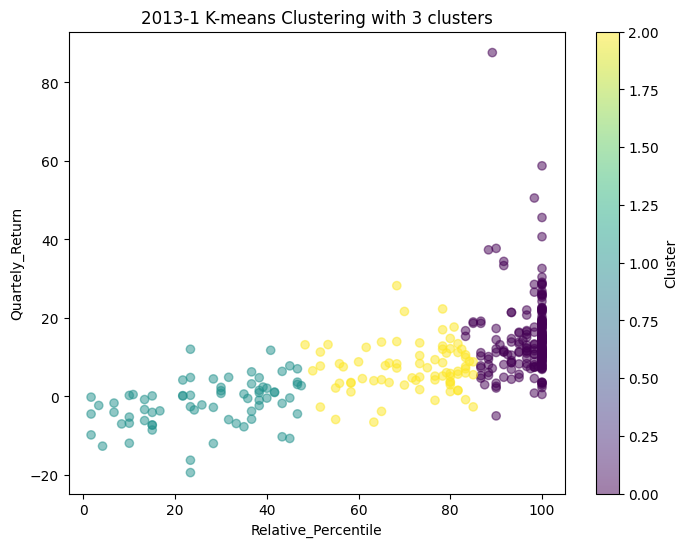

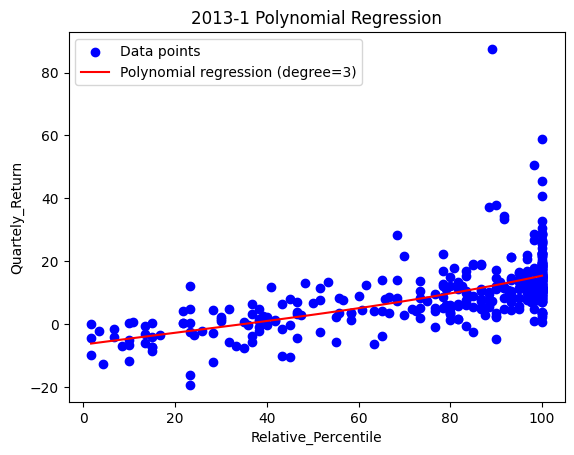

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


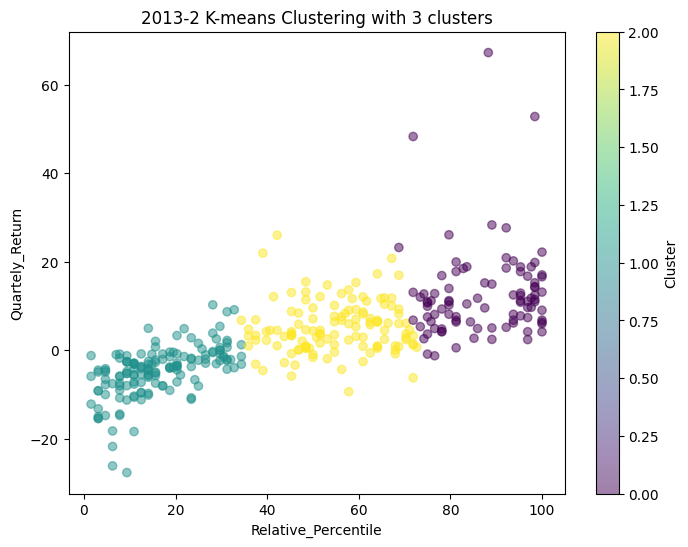

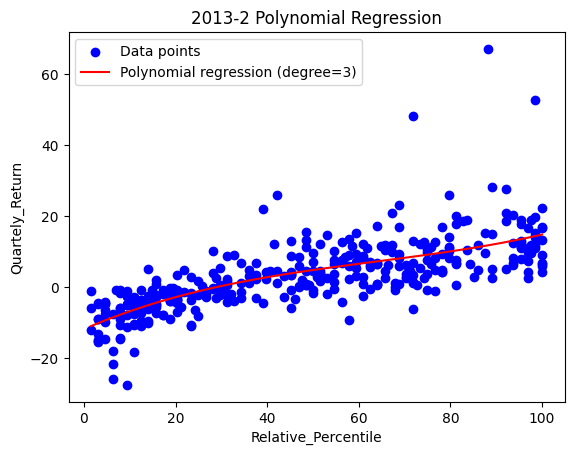

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


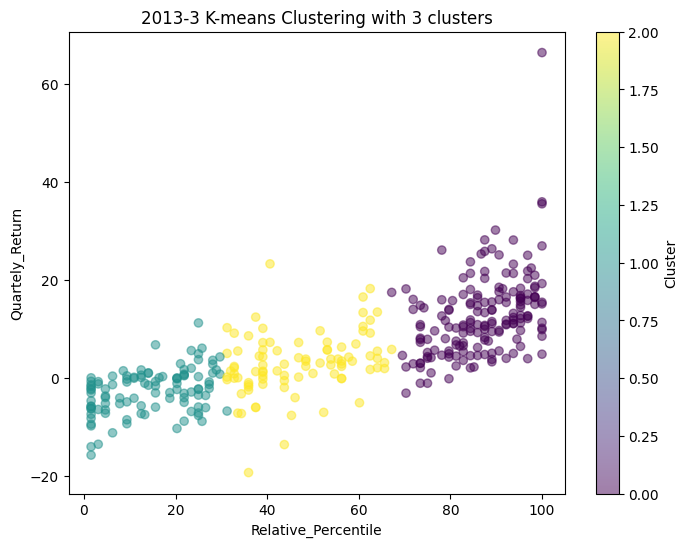

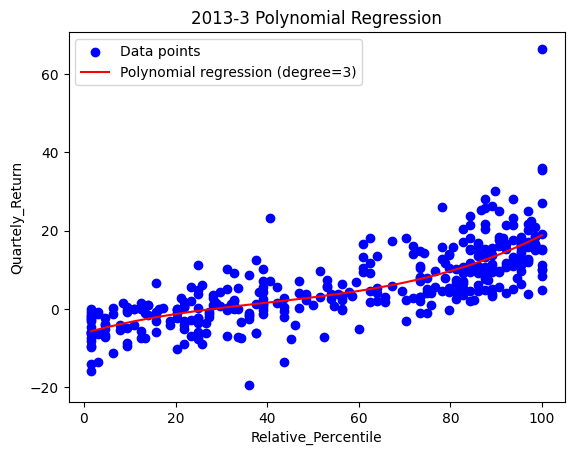

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


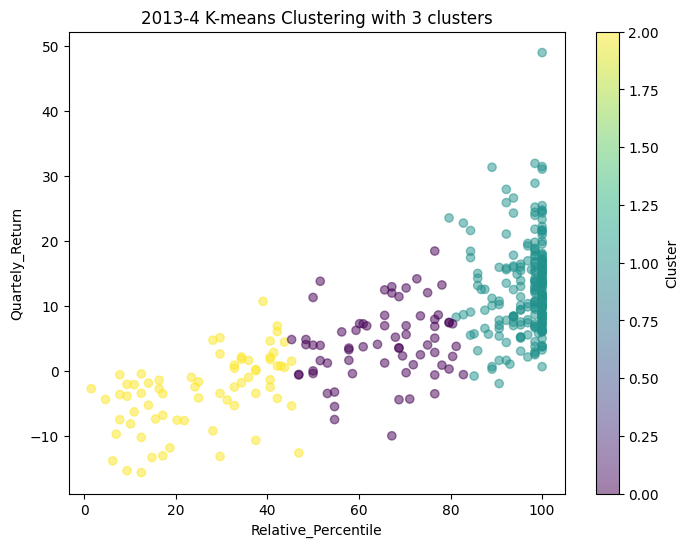

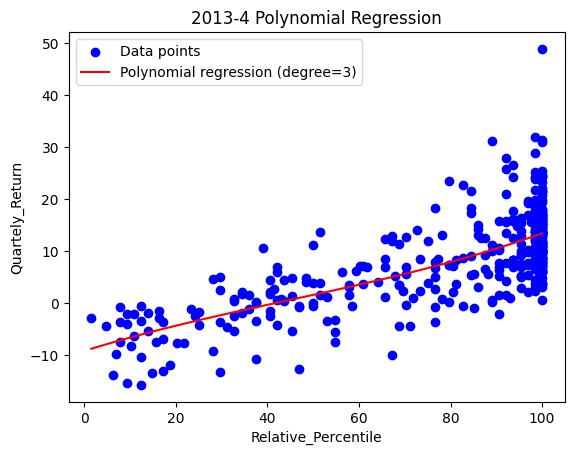

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


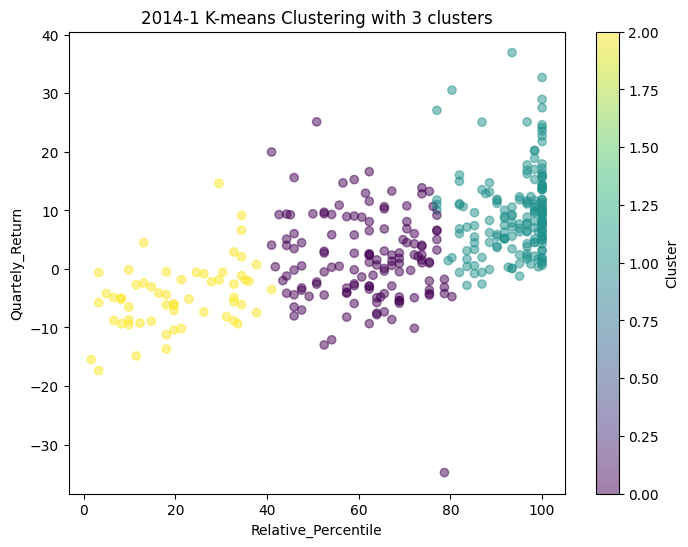

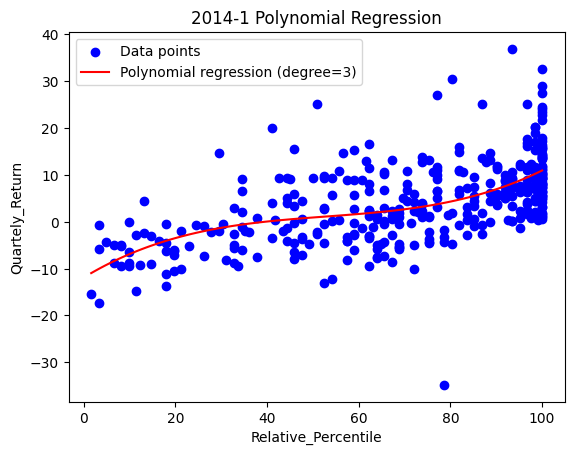

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


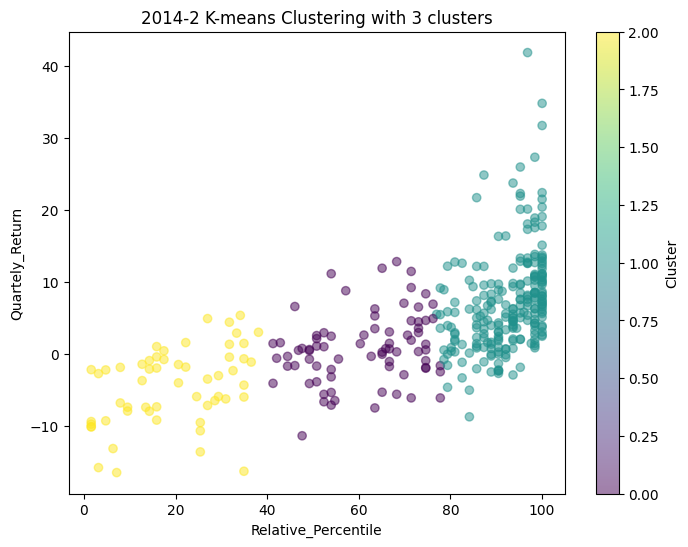

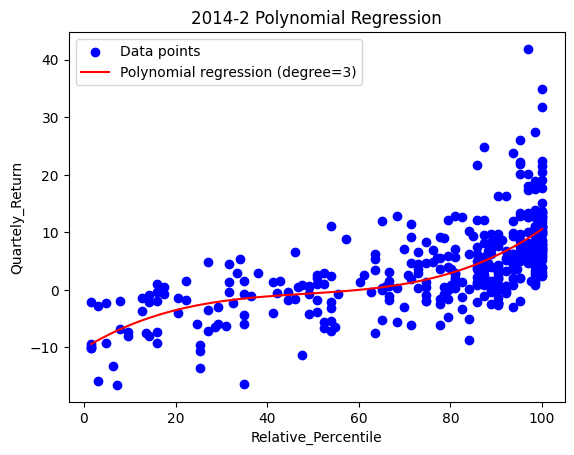

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


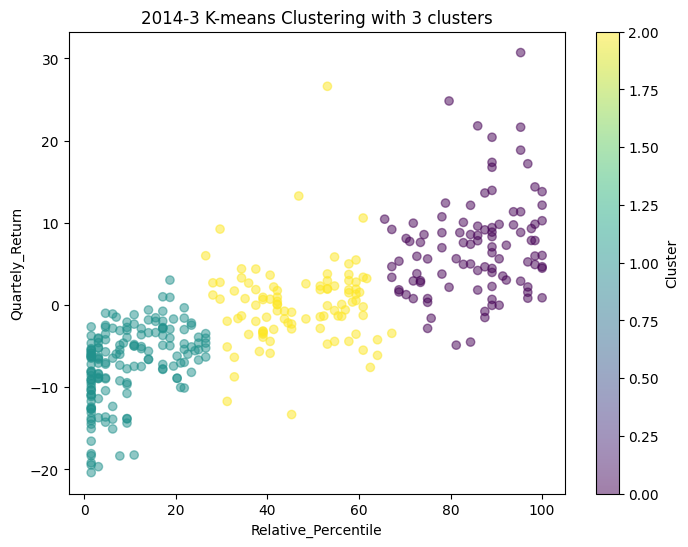

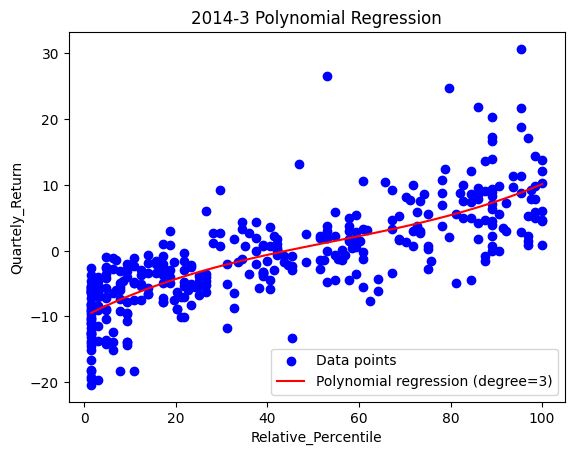

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


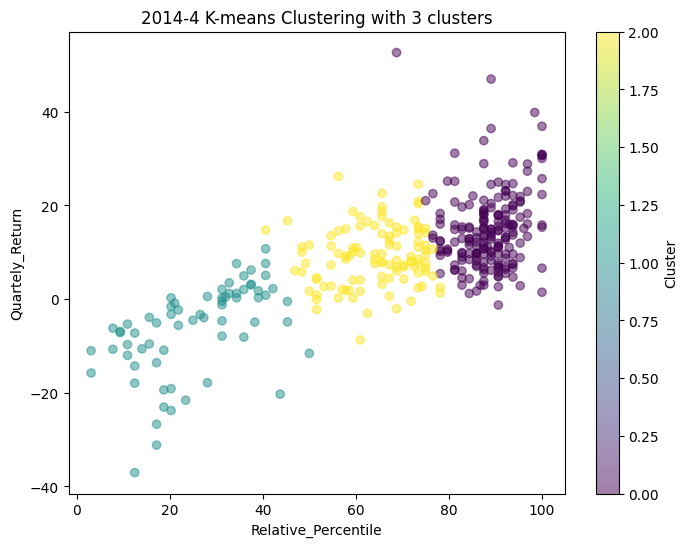

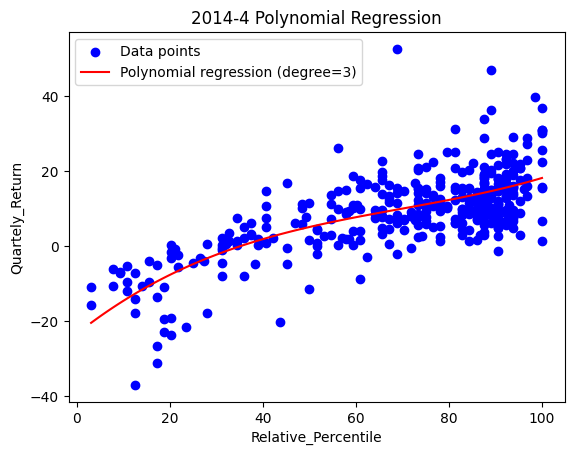

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


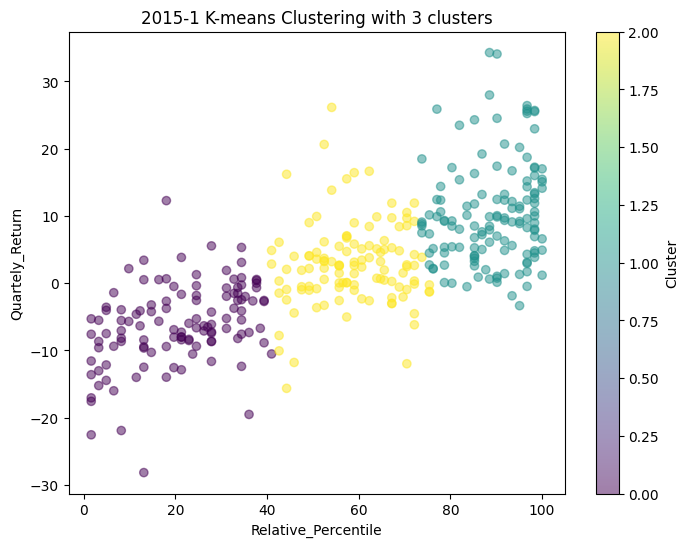

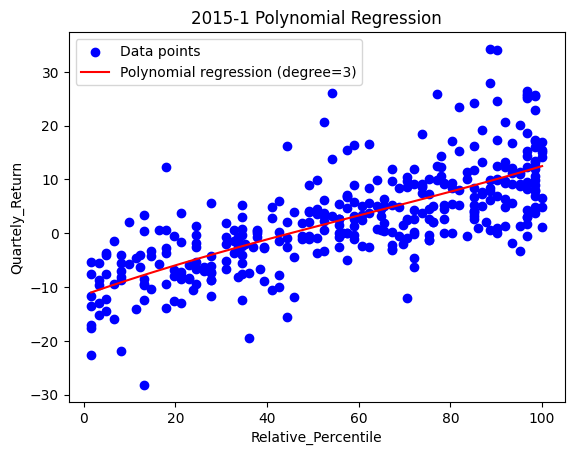

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


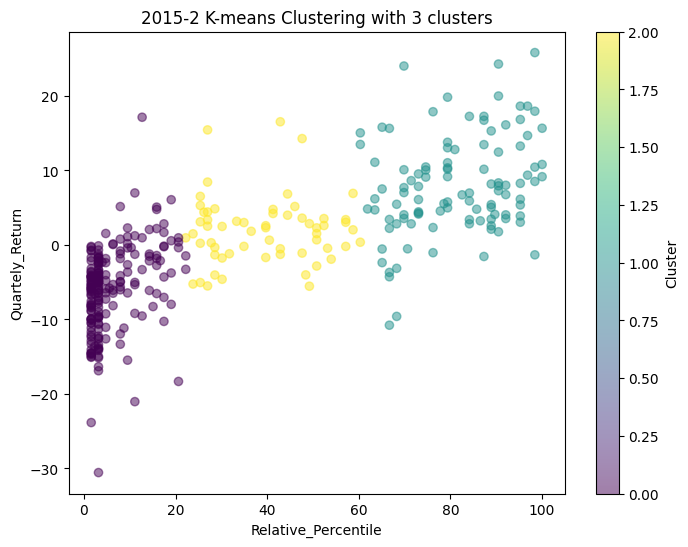

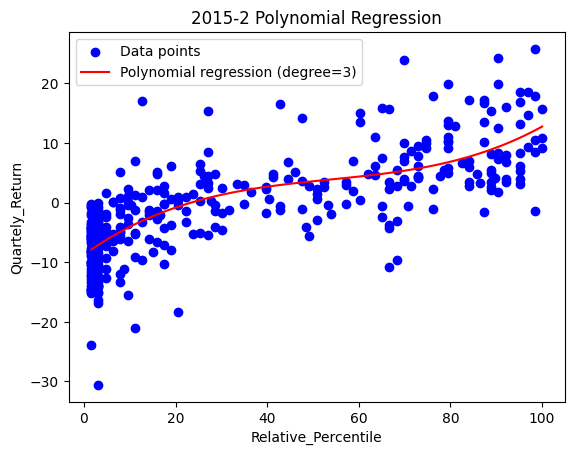

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


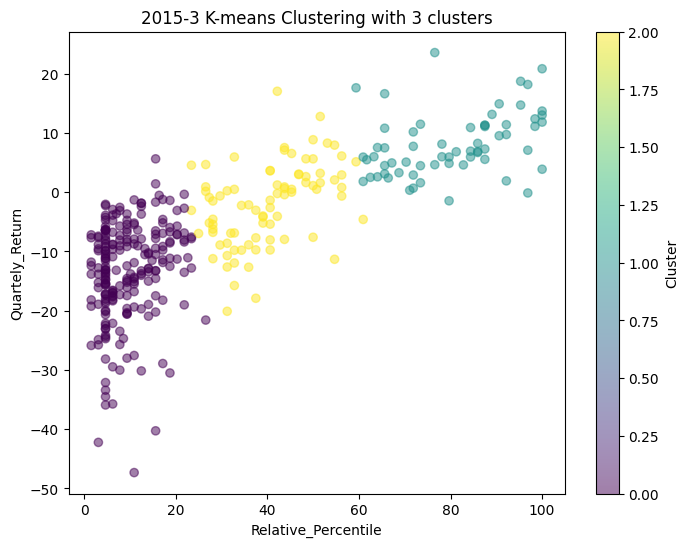

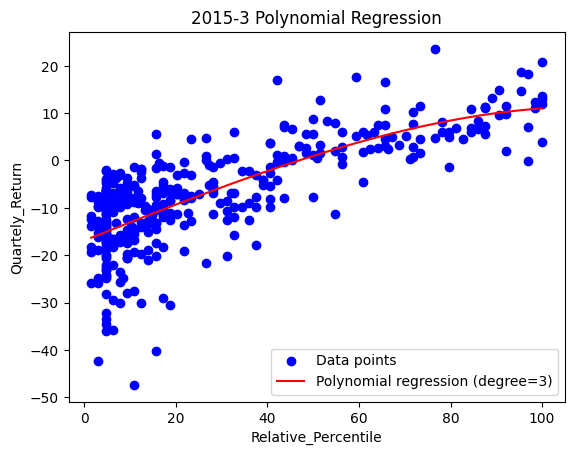

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


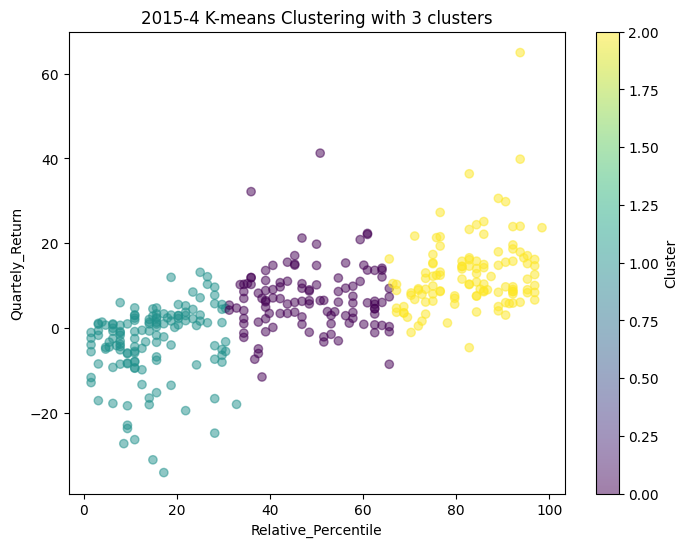

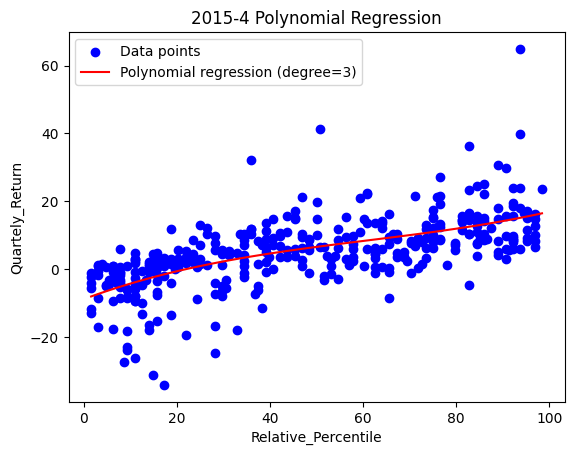

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


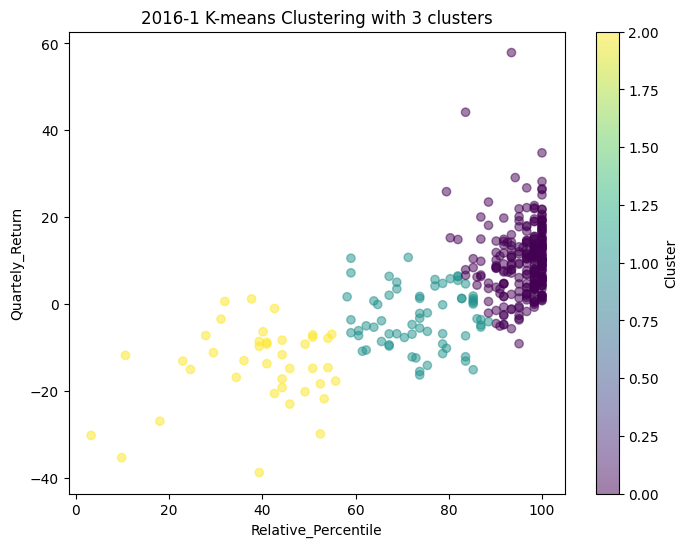

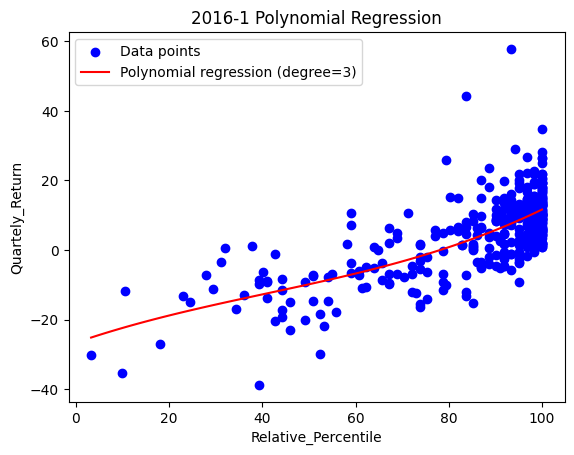

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


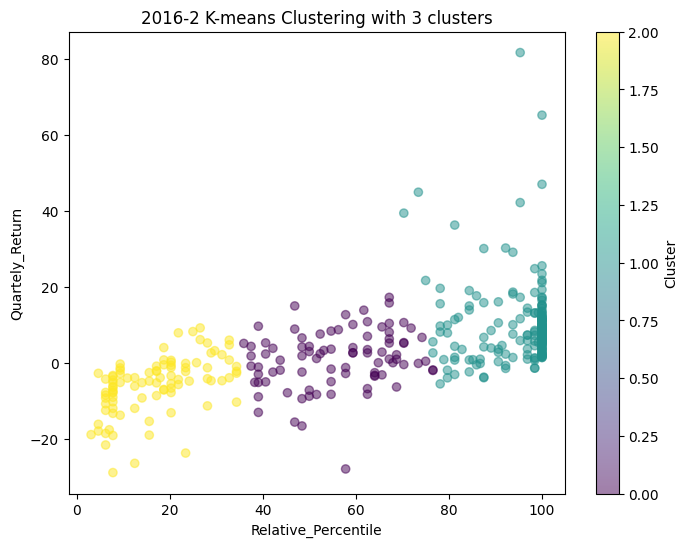

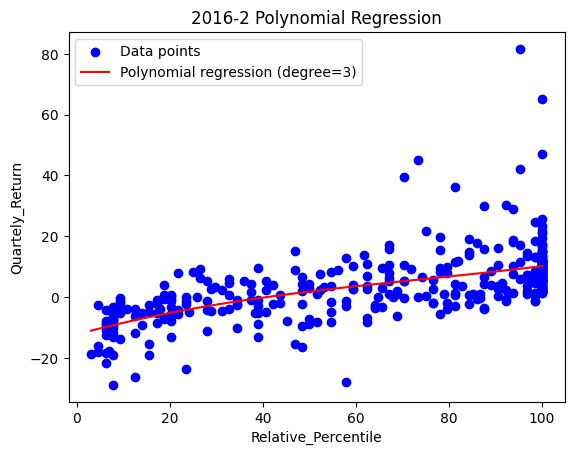

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


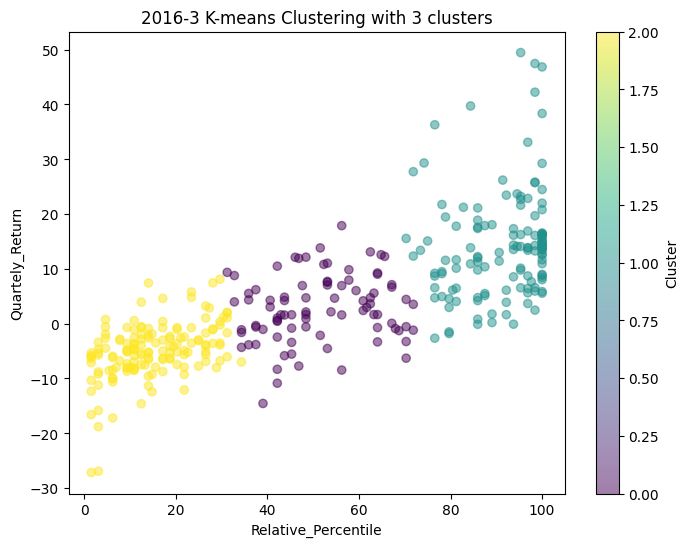

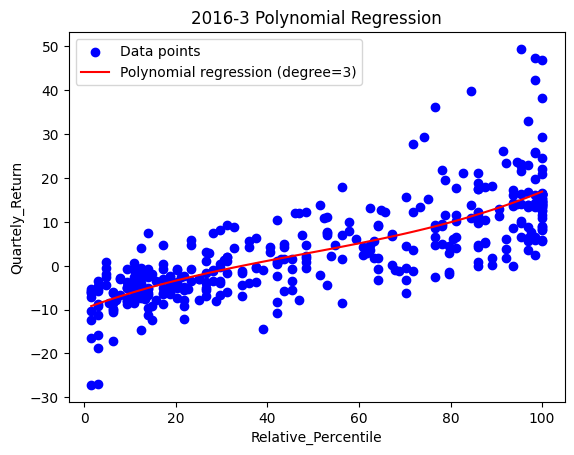

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


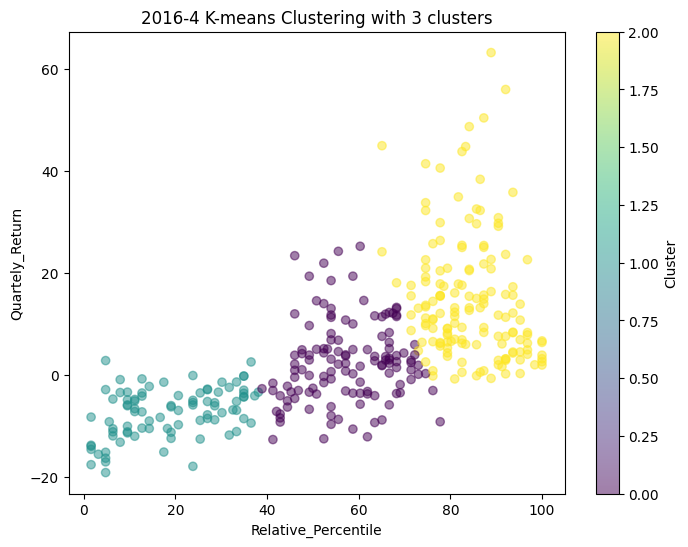

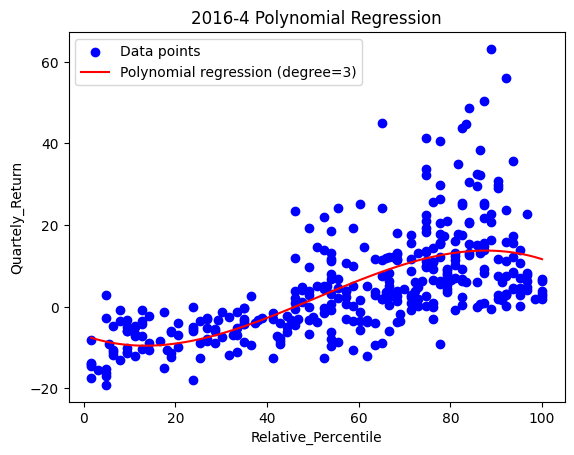

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


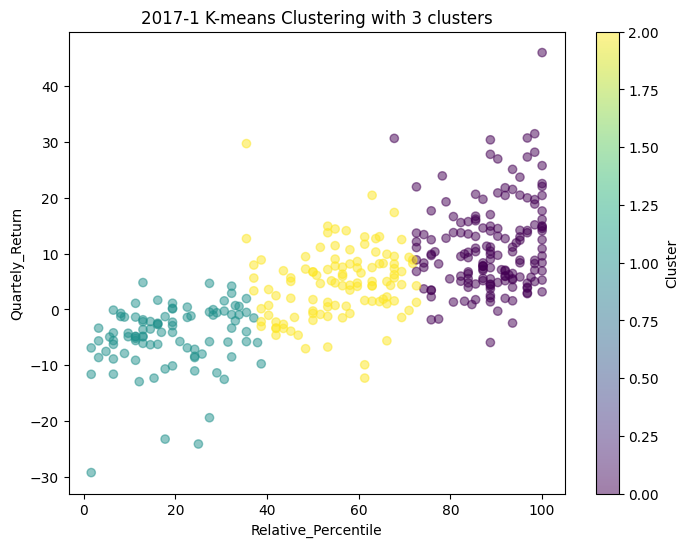

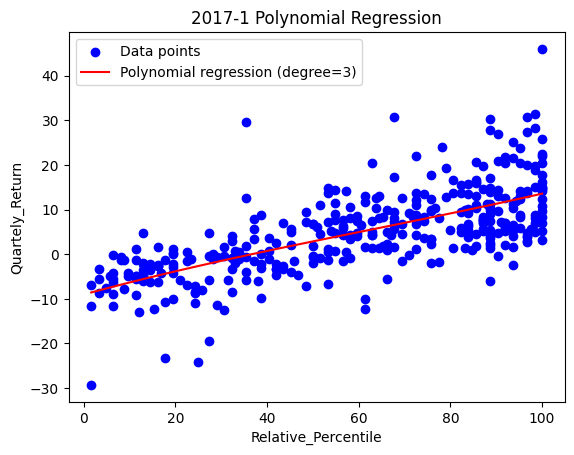

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


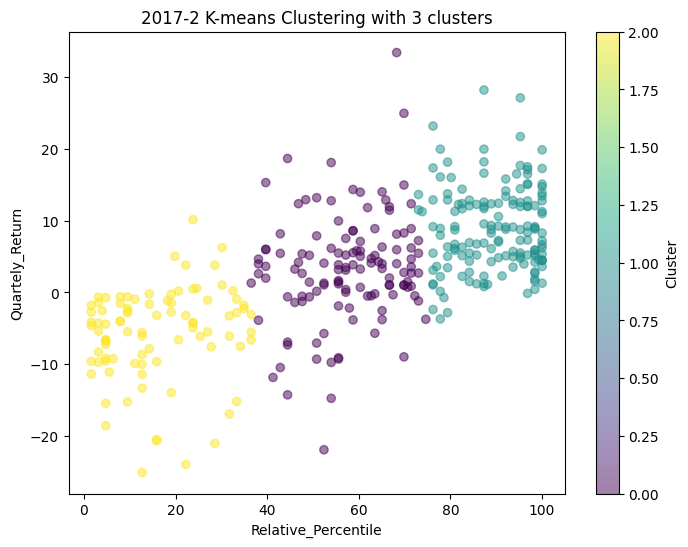

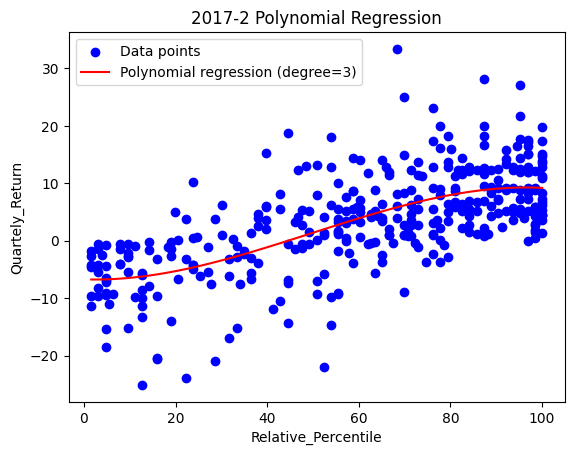

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


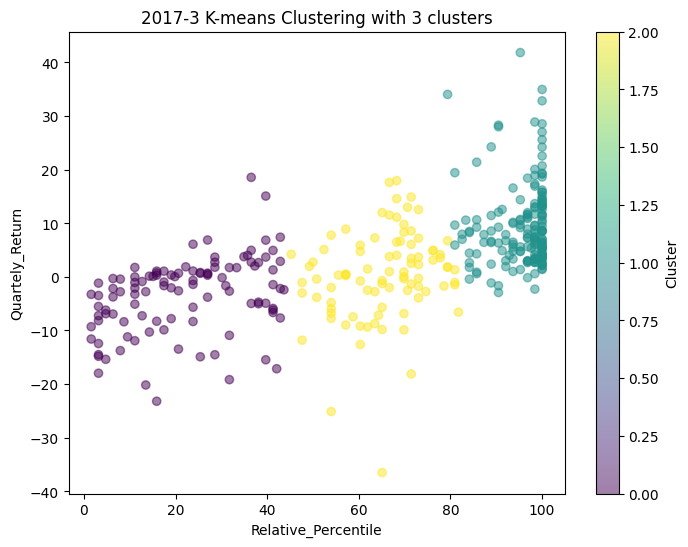

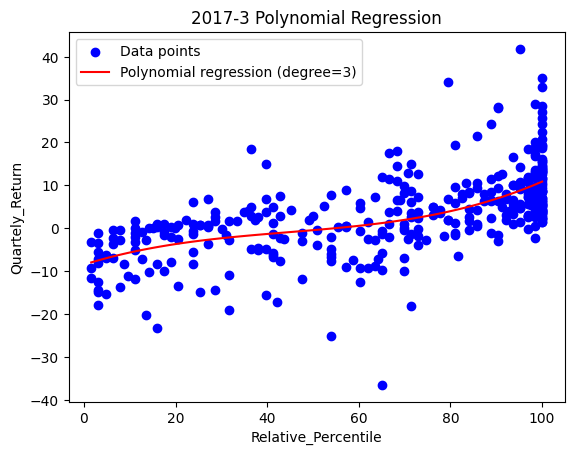

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


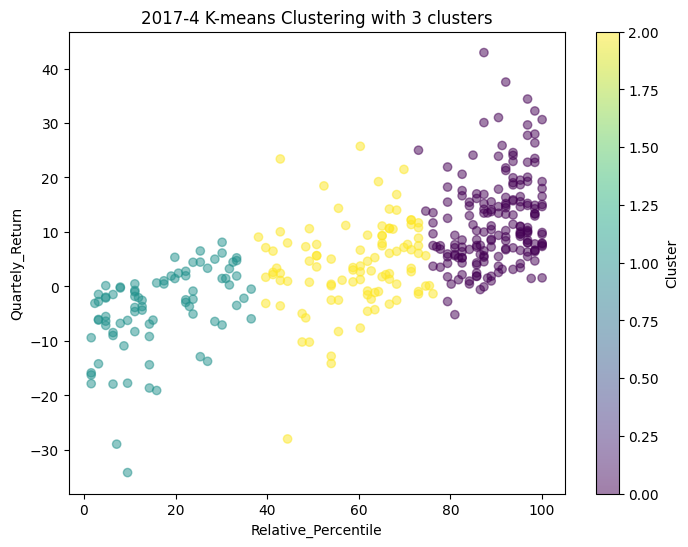

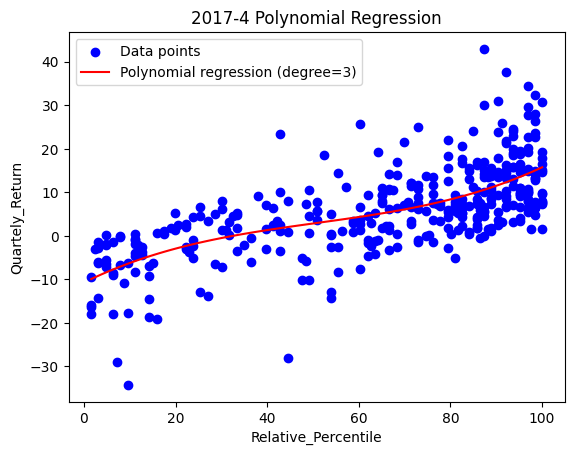

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


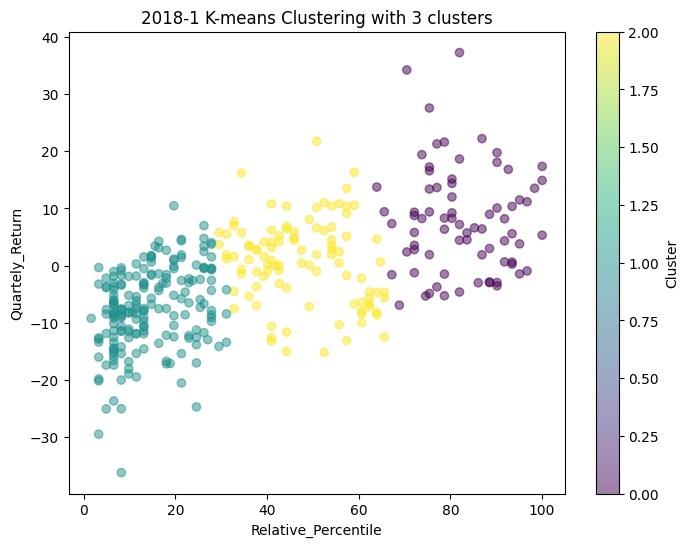

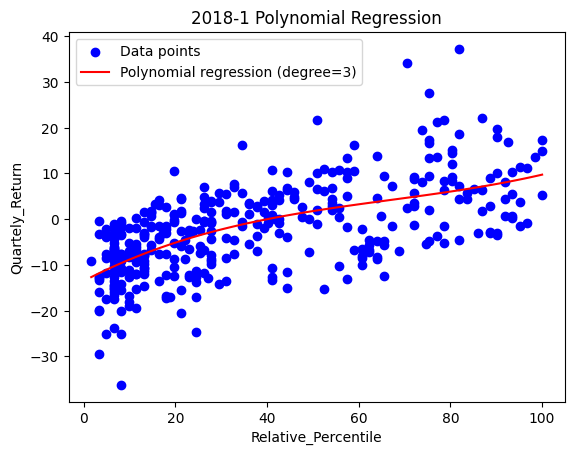

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


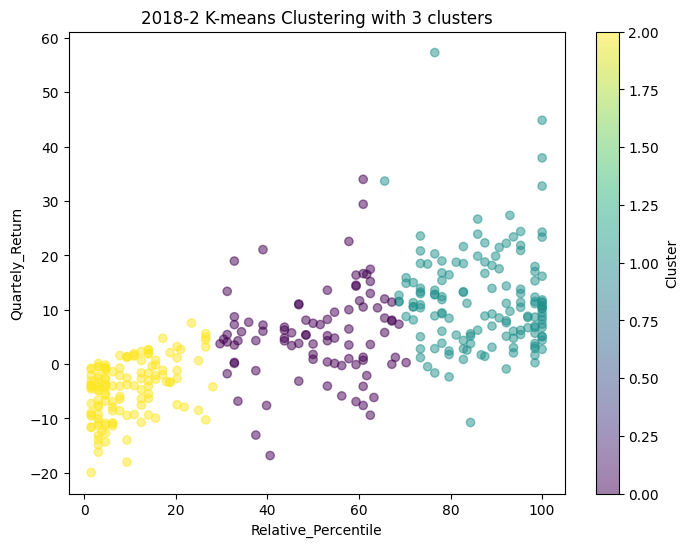

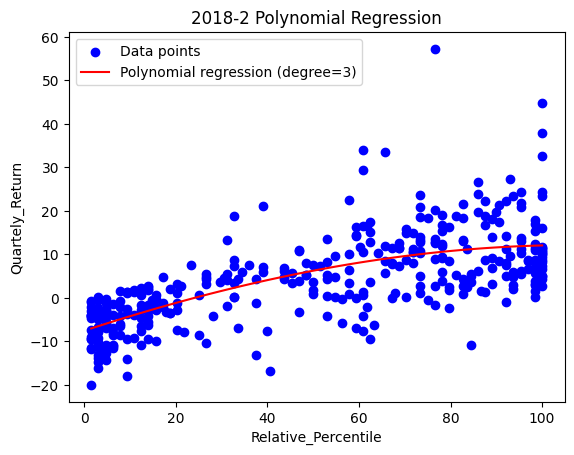

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


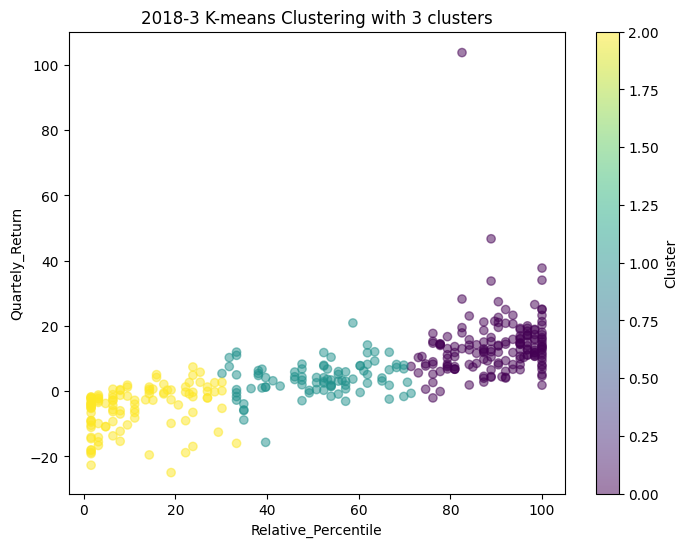

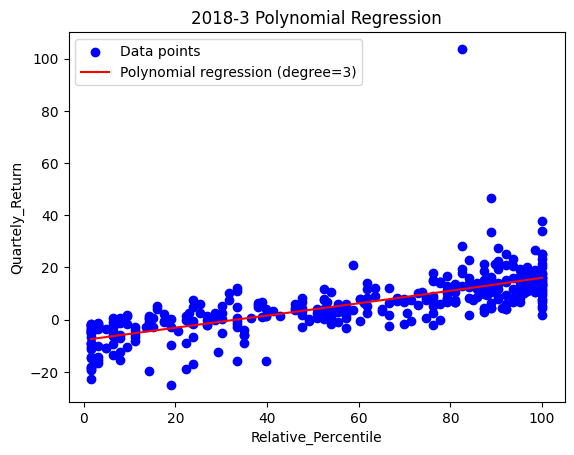

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


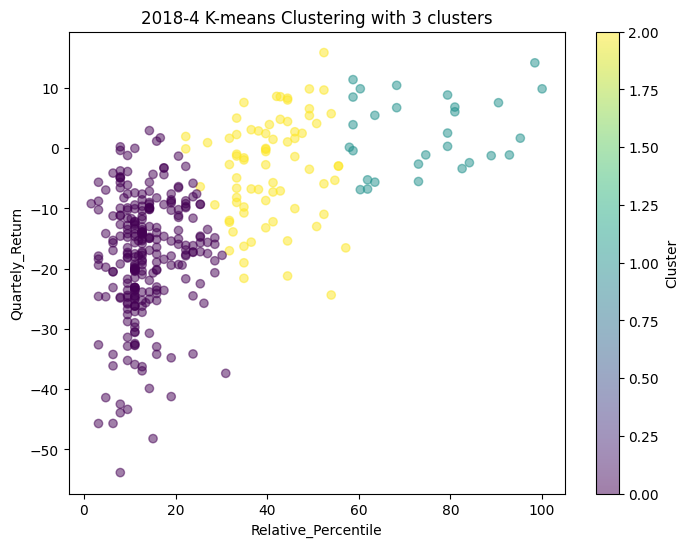

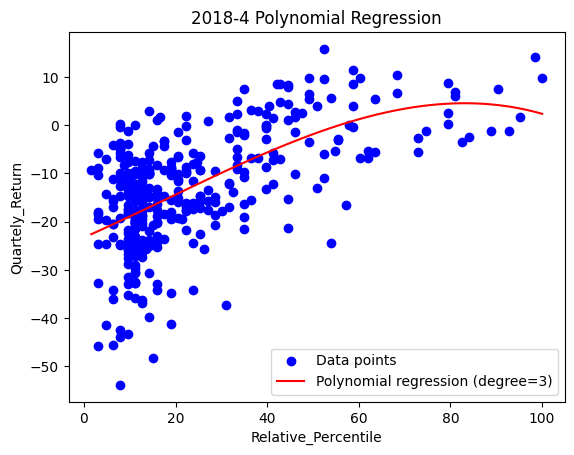

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


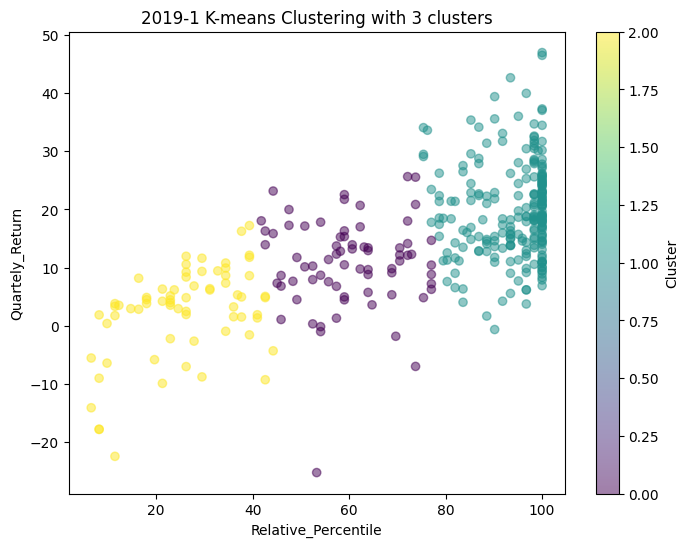

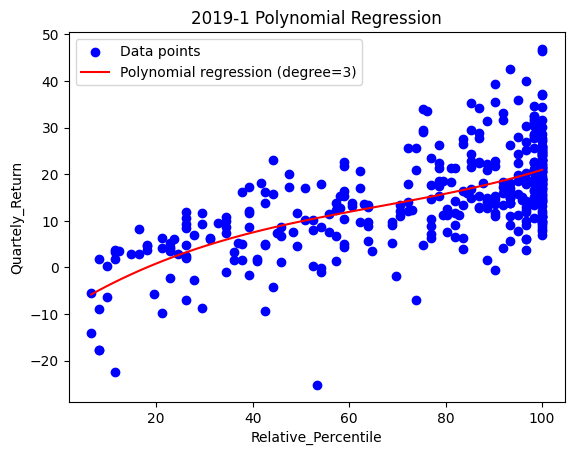

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


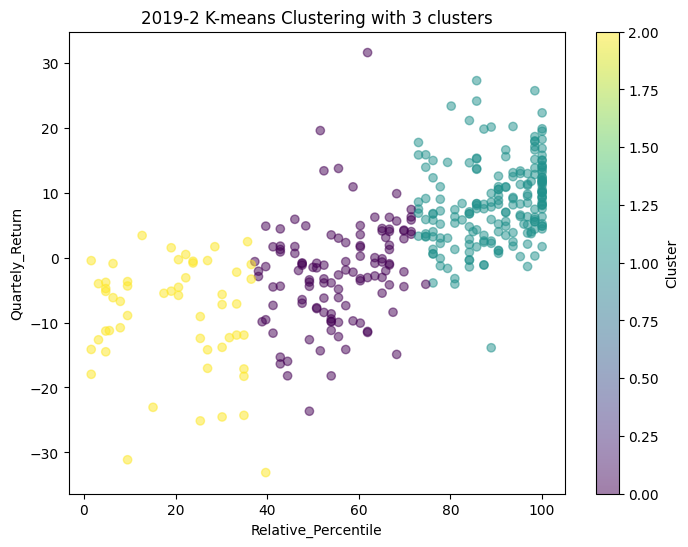

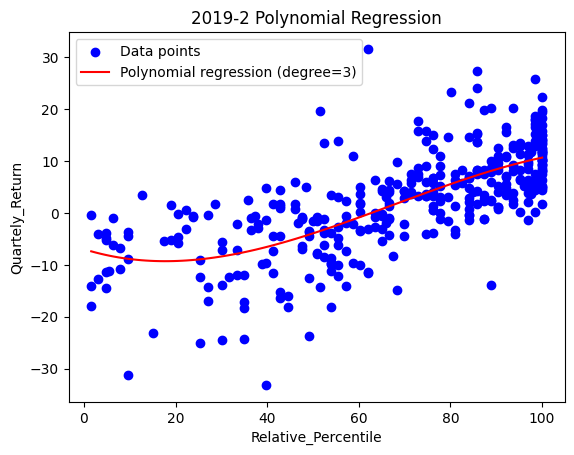

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


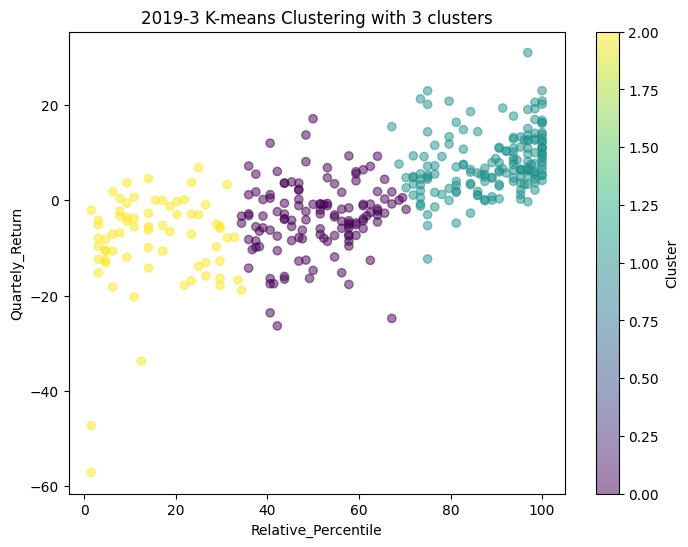

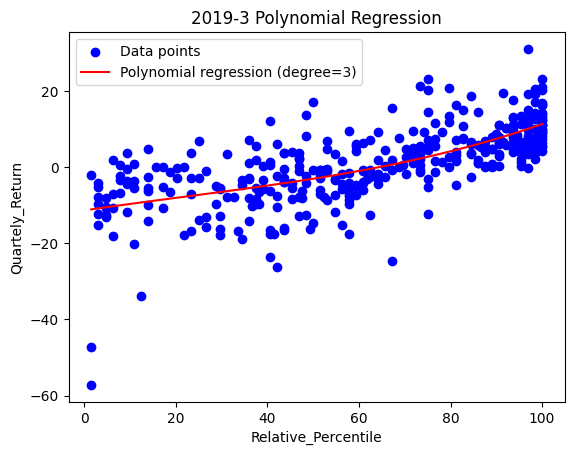

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


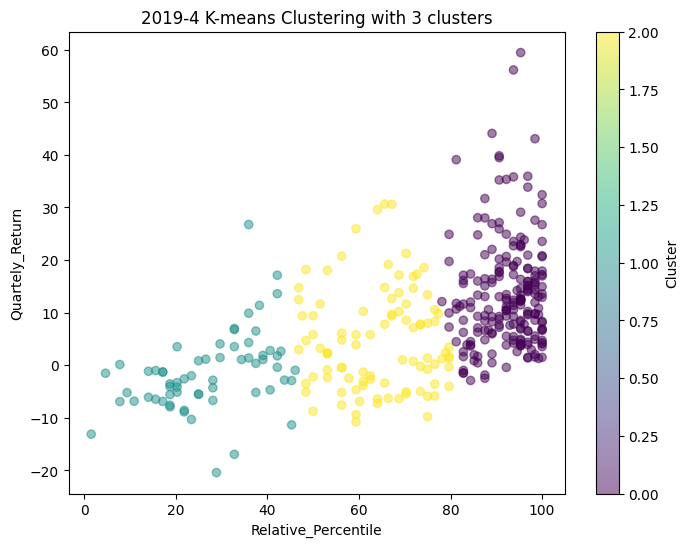

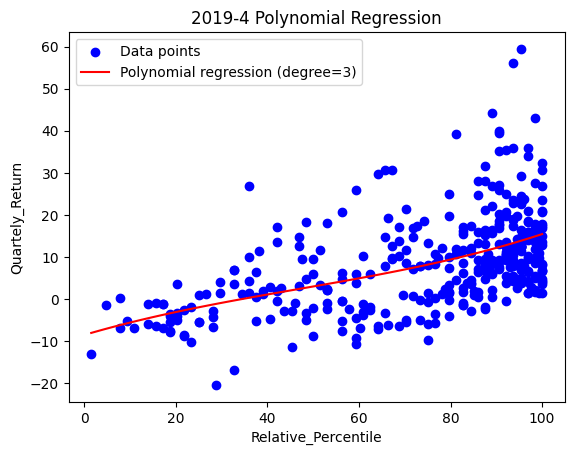

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


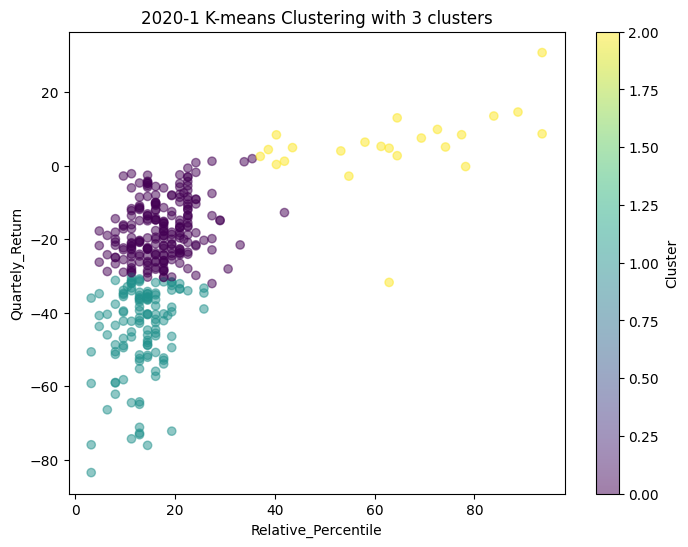

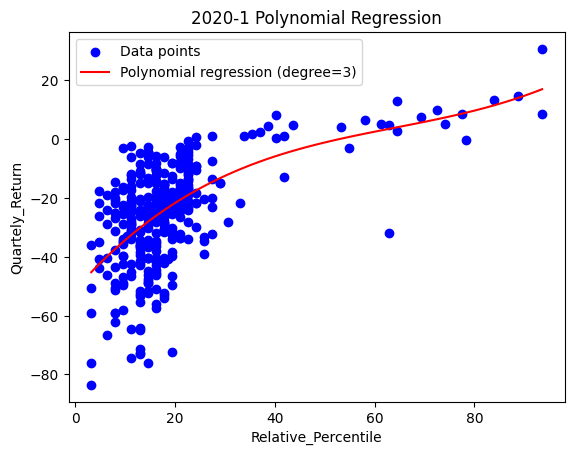

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


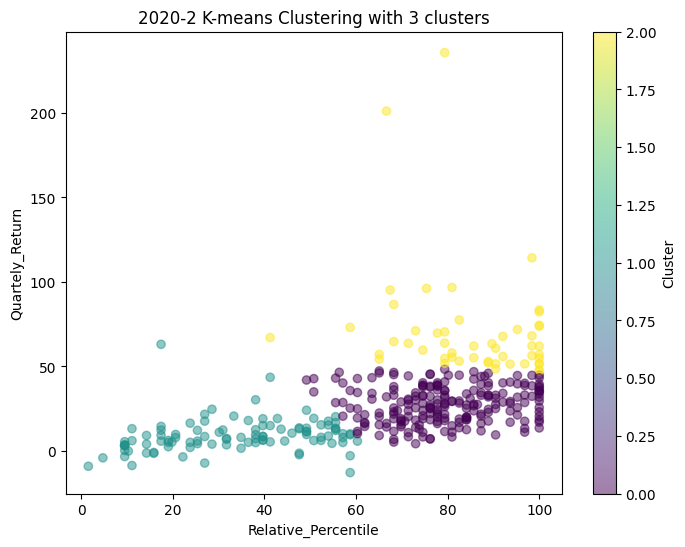

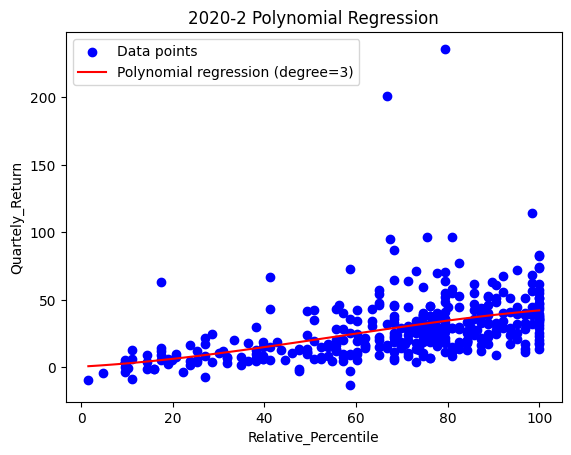

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


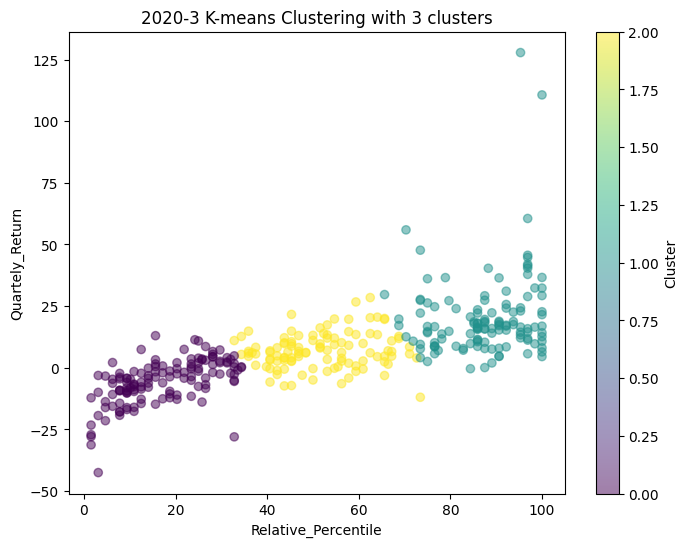

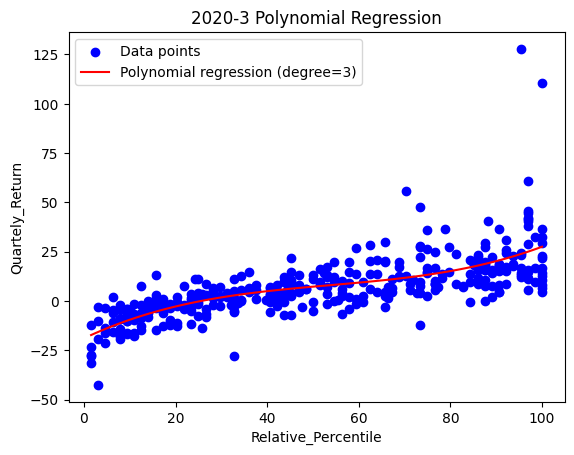

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


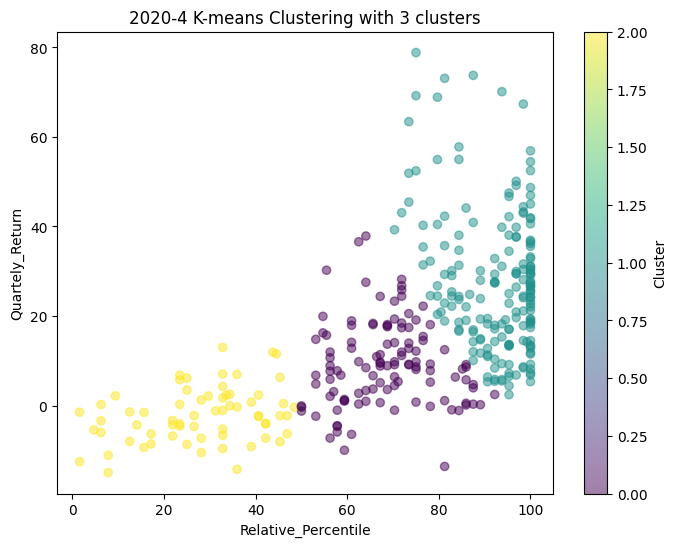

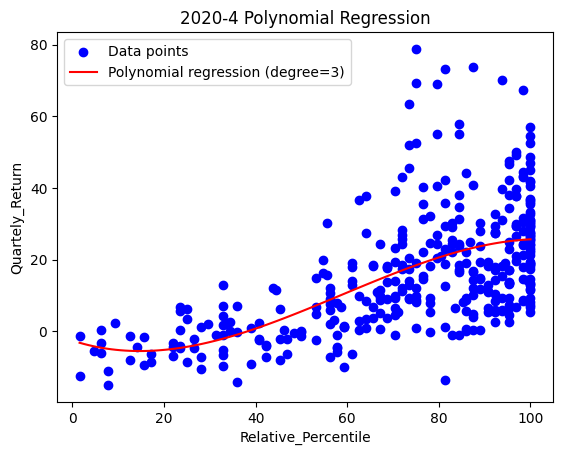

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


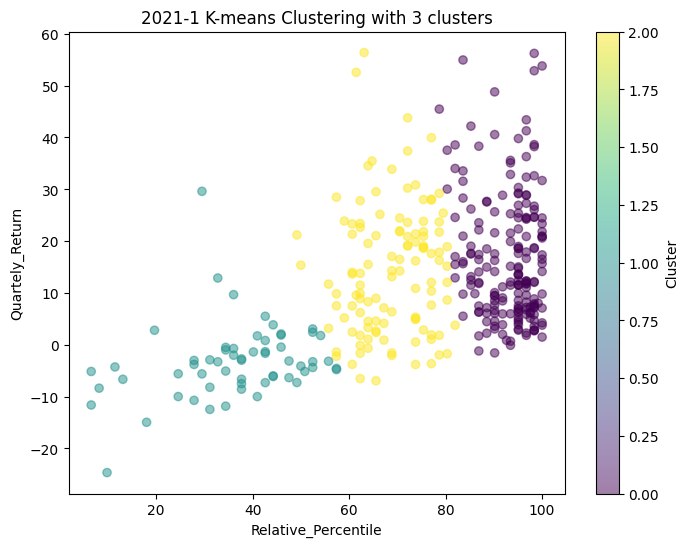

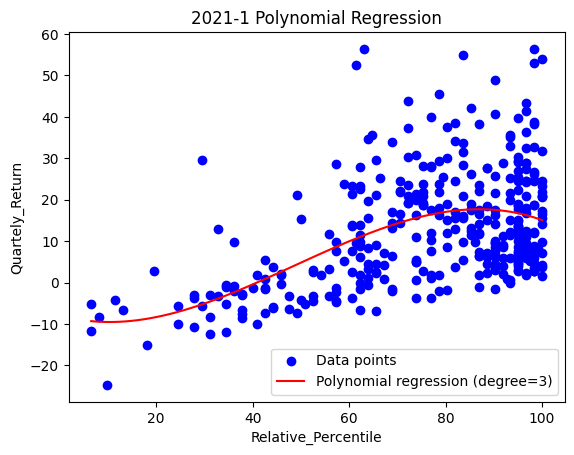

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


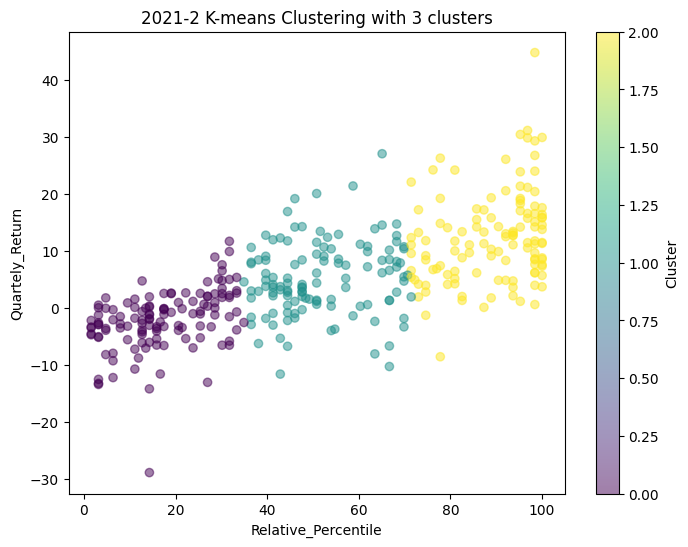

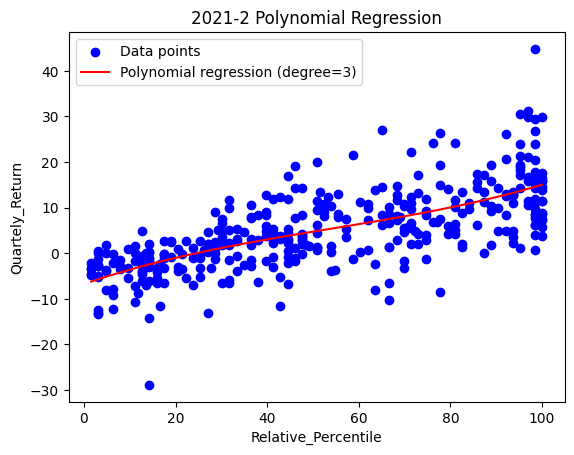

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


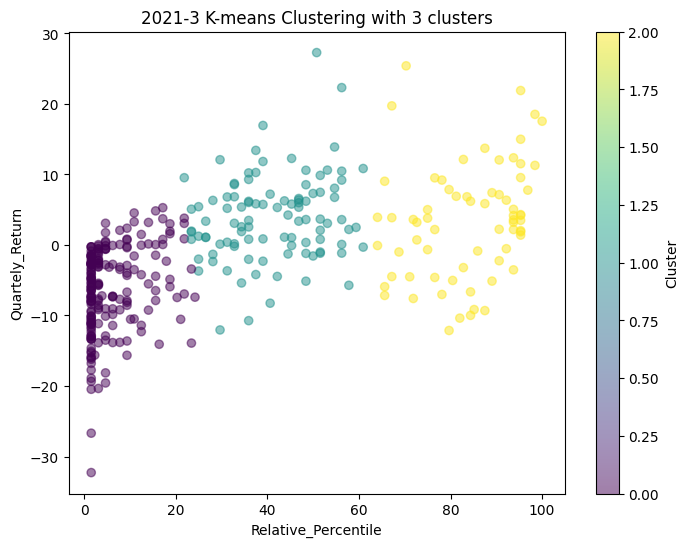

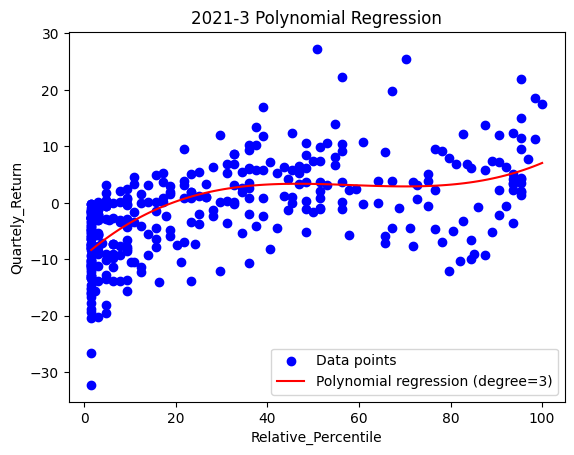

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


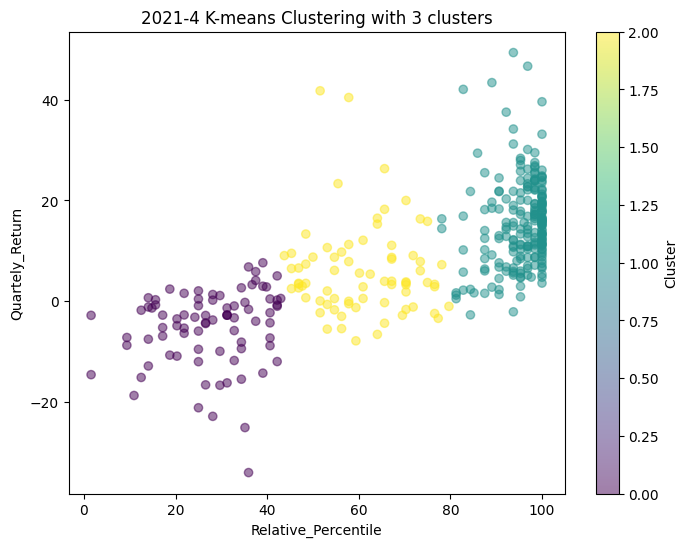

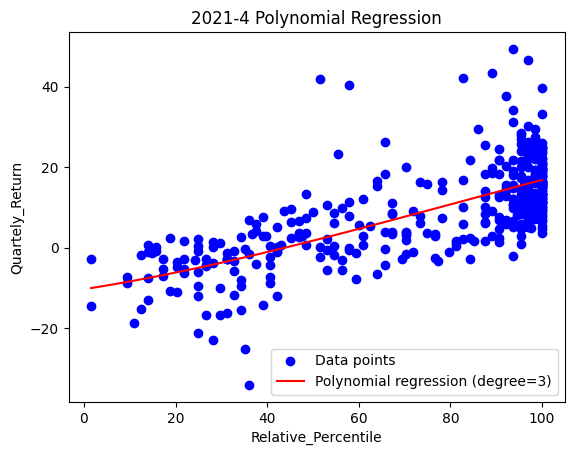

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


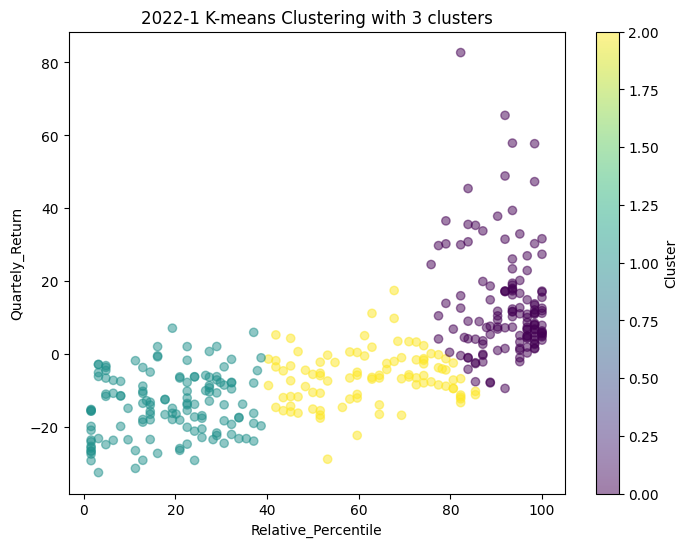

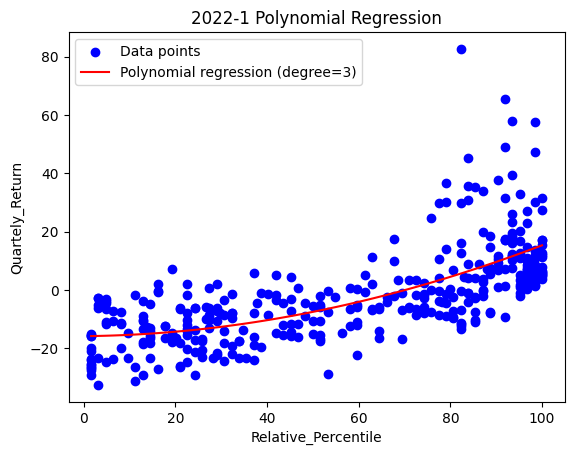

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


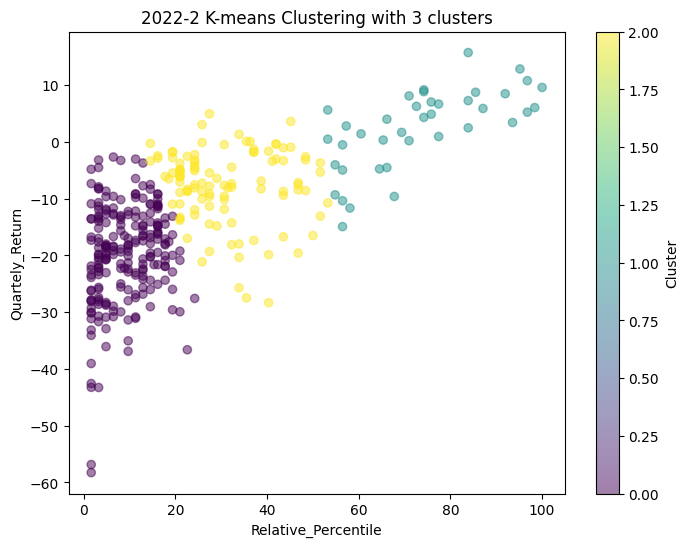

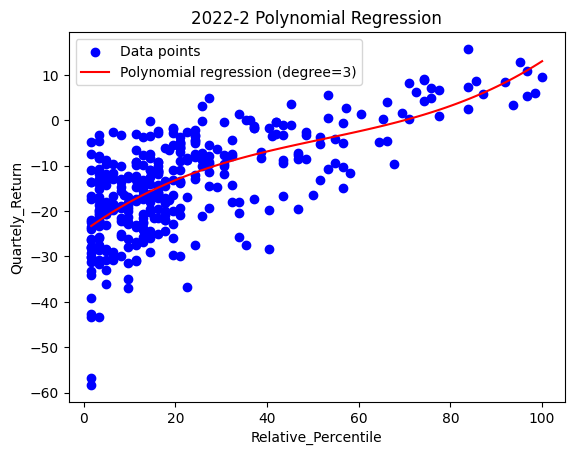

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


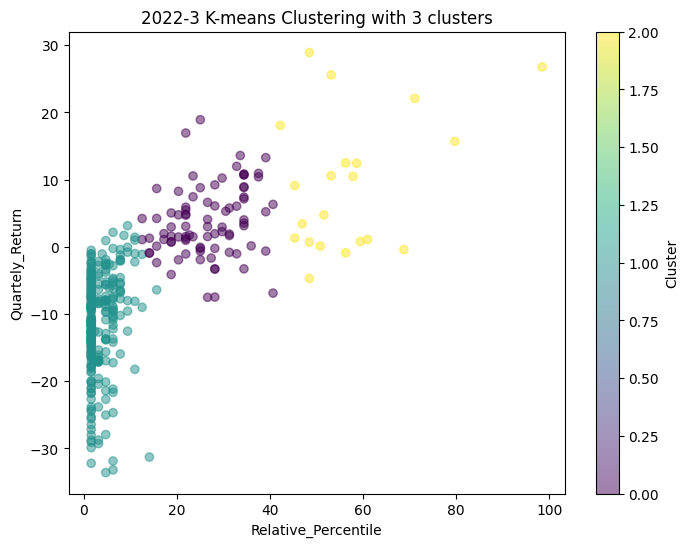

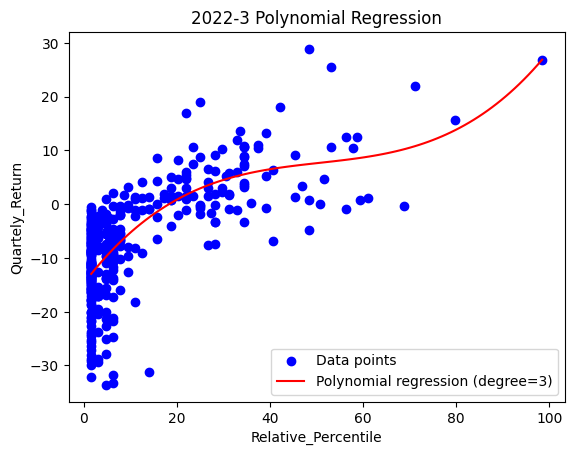

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


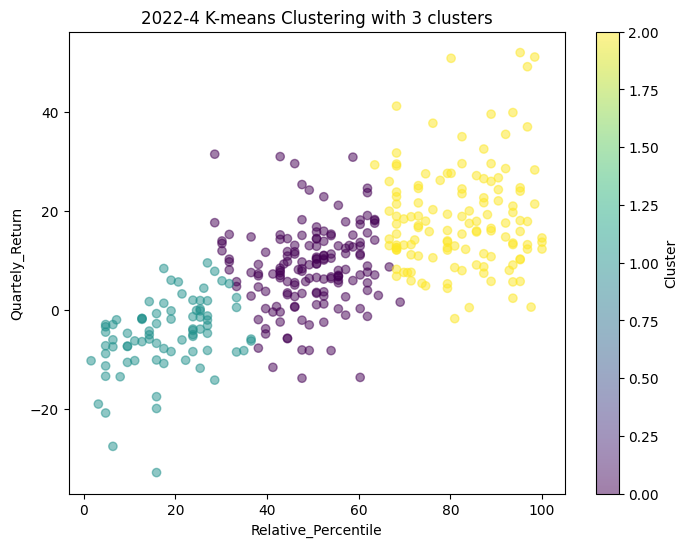

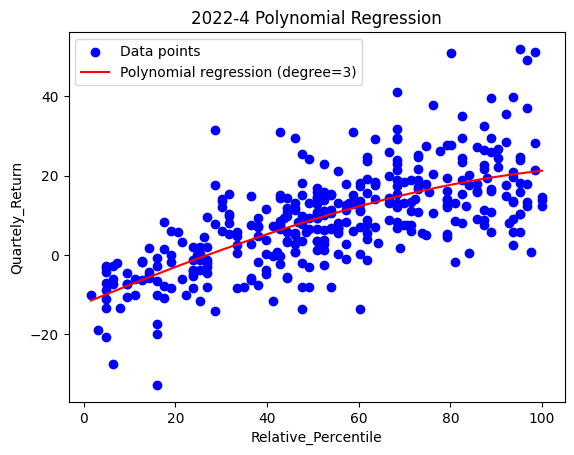

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


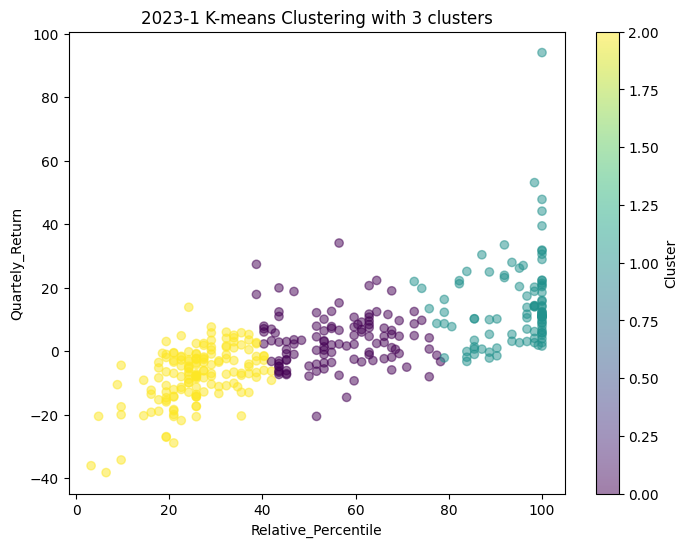

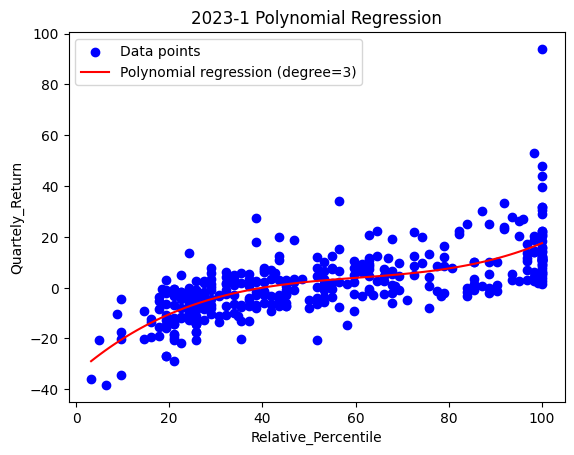

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


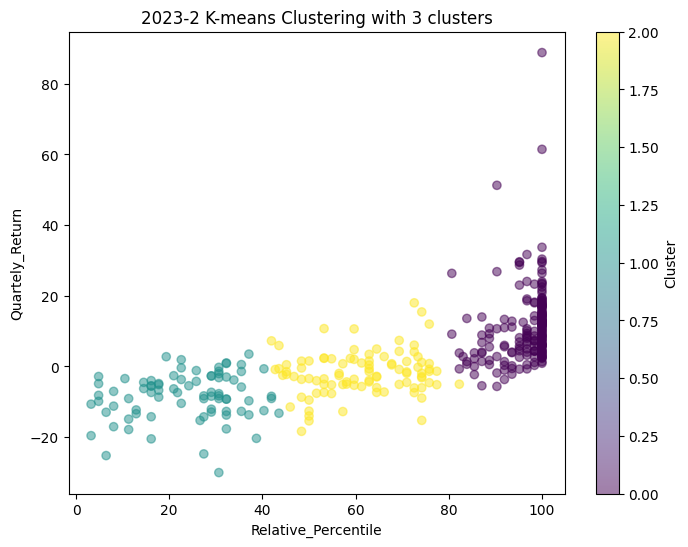

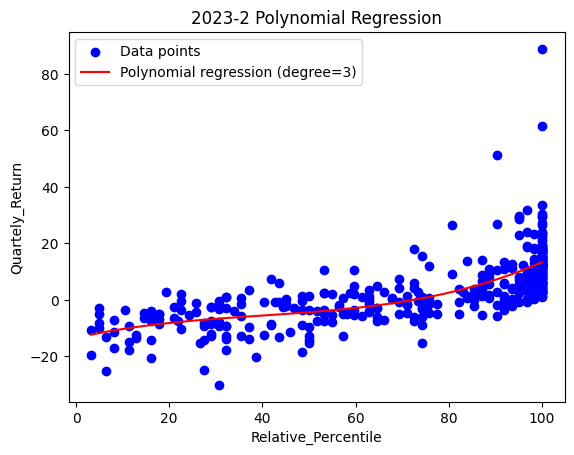

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


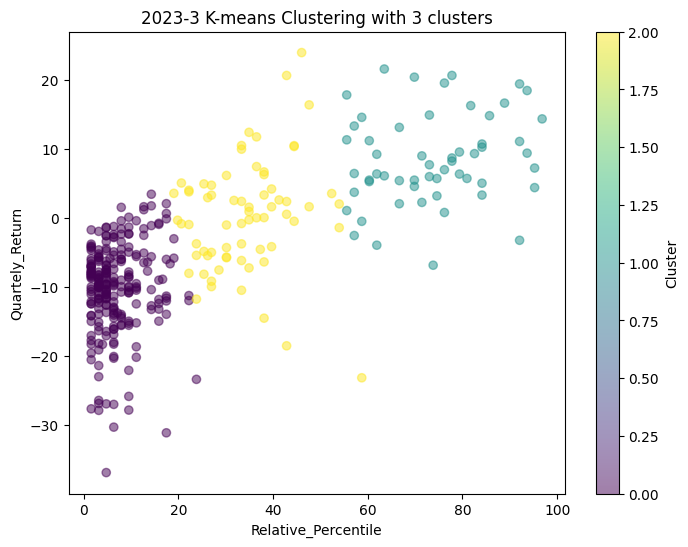

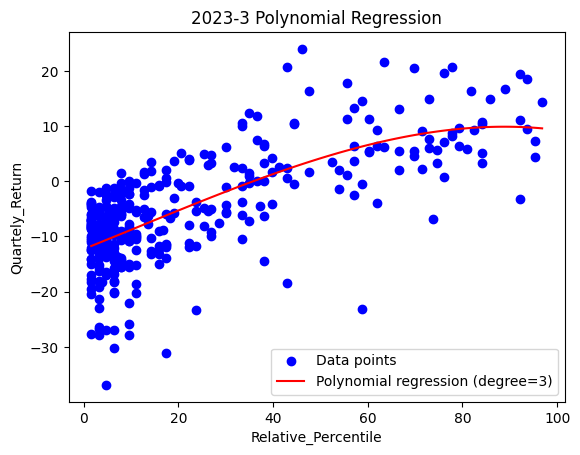

E:\Alphablock\clustering-in-mean-reversion-framework\dependencies.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Cluster'] = kmeans.labels_


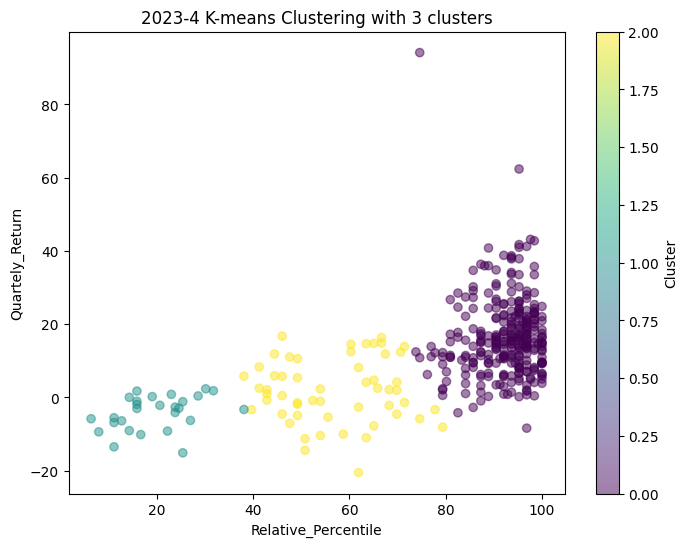

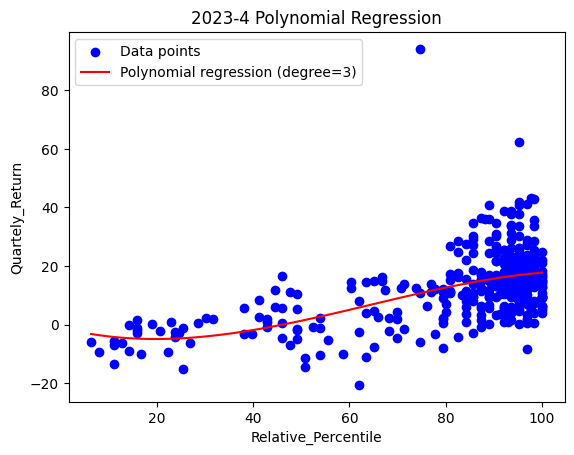

In [4]:
import numpy as np

cmap = plt.cm.viridis
norm = mcolors.Normalize(vmin=0, vmax=2)
num_colors = 25
random_colors = np.random.rand(num_colors, 3)
index = 1
all_xs_pred = None
all_y_pred = None

for year in processing_years:
    for quarter in quarters:
        filtered_data_frame_by_quarter = data_frame_quarter_percentile[(data_frame_quarter_percentile['Year'] == year) & (data_frame_quarter_percentile['Quarter'] == quarter)]
        
        perform_kmeans_clustering(filtered_data_frame_by_quarter, ['Relative_Percentile', 'Quartely_Return'], cmap, str(year) + '-' + str(quarter) + ' K-means Clustering with 3 clusters', save_as_image=False)
        perform_polynomial_on_clustering(filtered_data_frame_by_quarter, ['Relative_Percentile', 'Quartely_Return'], str(year) + '-' + str(quarter) + ' Polynomial Regression', save_as_image=False)
        all_xs_pred, all_y_pred = combine_polynomial_plots(filtered_data_frame_by_quarter, ['Relative_Percentile', 'Quartely_Return'], all_xs_pred, all_y_pred)

In [19]:
num_colors = 100
random_colors = []

while len(random_colors) < num_colors:
    color = np.random.rand(3)
    if not any(np.array_equal(color, existing_color) for existing_color in random_colors):
        random_colors.append(color)

random_colors = np.array(random_colors)

print(random_colors)

[[0.24646483 0.8789486  0.642958  ]
 [0.45082425 0.32801767 0.53448677]
 [0.61762506 0.76513454 0.92808541]
 [0.81869656 0.97787471 0.28292593]
 [0.07171581 0.67676512 0.57490513]
 [0.29260266 0.86545812 0.14169495]
 [0.19716906 0.72717728 0.10687978]
 [0.62797562 0.28379712 0.65486175]
 [0.80311186 0.08058263 0.23699483]
 [0.72359761 0.14121979 0.03876304]
 [0.24081762 0.70097421 0.67117764]
 [0.9142621  0.93410752 0.98339598]
 [0.04227379 0.85427968 0.33742144]
 [0.65272486 0.36844896 0.39123166]
 [0.09869824 0.93805791 0.19273299]
 [0.93746025 0.63141892 0.38348235]
 [0.63031527 0.13520133 0.27873182]
 [0.03642985 0.40255605 0.97137079]
 [0.09743196 0.82193368 0.66022483]
 [0.42809283 0.94786444 0.18468665]
 [0.09763468 0.71849231 0.41901191]
 [0.84318559 0.82495228 0.66884847]
 [0.77933896 0.41414361 0.47446796]
 [0.23143237 0.22487334 0.67592958]
 [0.19302802 0.45163855 0.0361084 ]
 [0.43617575 0.396316   0.9550455 ]
 [0.31548976 0.99000011 0.6810612 ]
 [0.87137585 0.92486208 0.24

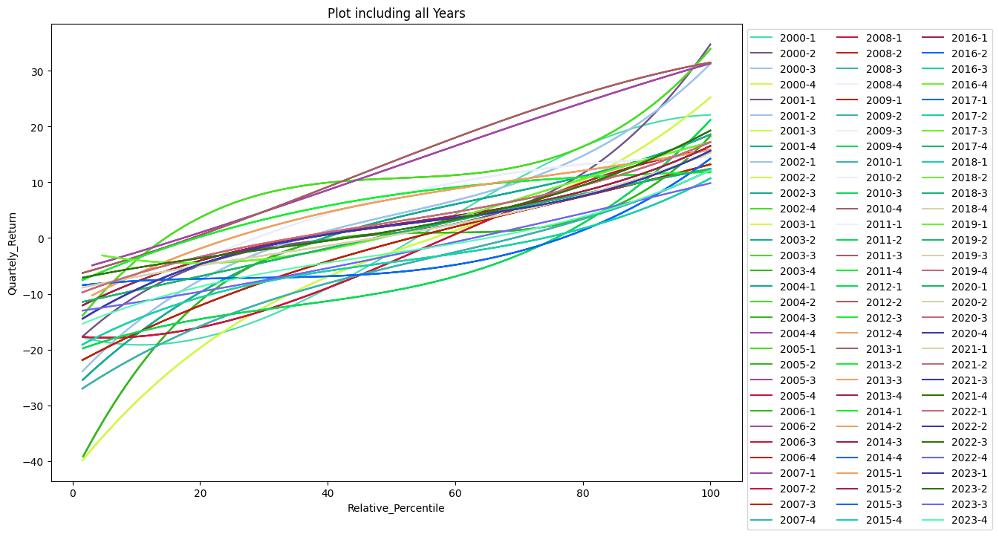

In [20]:
plt.figure(figsize=(12, 8))

for i, year in enumerate(processing_years):
    for j, quarter in enumerate(quarters):
        plt.plot(all_xs_pred[i + j], all_y_pred[i + j], color=random_colors[i + j], label=str(year) + '-' + str(quarter))

plt.xlabel('Relative_Percentile')
plt.ylabel('Quartely_Return')
plt.title('Plot including all Years')

num_cols = 3  
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=num_cols)

# plt.savefig("regressions/all-years-plot")
plt.show()
